In [312]:
import os
import sys
import warnings
warnings.filterwarnings('ignore')

import numpy as np
import pandas as pd

from matplotlib import pyplot as plt
from IPython.display import display
import seaborn as sns
sns.set()
sns.set()
# plt.style.use('fivethirtyeight')
import scienceplots
plt.style.context(['science', 'nature', 'muted'])
%config InlineBackend.figure_format = 'retina'
%matplotlib inline

from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
import xgboost as xgb
from xgboost import XGBClassifier

from sklearn import metrics
from sklearn.metrics import (make_scorer, confusion_matrix, 
                             accuracy_score, brier_score_loss,
                             precision_score, recall_score,
                             f1_score, cohen_kappa_score,
                             average_precision_score,
                             precision_recall_curve)
from sklearn.model_selection import cross_val_score, StratifiedKFold, GridSearchCV
from sklearn.calibration import CalibratedClassifierCV, calibration_curve

# Add our local functions to the path
sys.path.append(os.path.join(os.pardir, 'src'))
from models import evaluation
from data.load_data import (get_data_filepaths, 
                            split_features_labels_weights, 
                            load_data)


COUNTRY2 = 'full_merged_dumvar'
TRAIN_PATH2, TEST_PATH2 = get_data_filepaths(COUNTRY2)

COUNTRY = 'full_merged'
TRAIN_PATH, TEST_PATH = get_data_filepaths(COUNTRY)

NameError: name 'warnings' is not defined

In [257]:
#Logistic Regression
# Load and transform the training data
X_train_log, y_train_log, w_train_log = load_data(TRAIN_PATH2)
# Load and transform the test set
X_test_log, y_test_log, w_test_log = load_data(TEST_PATH2)


#XGBoost
# Load and transform the training data
X_train_xgb, y_train_xgb, w_train_xgb = split_features_labels_weights(TRAIN_PATH)
X_train_xgb = X_train_xgb.to_numpy()
w_train_xgb = w_train_xgb.to_numpy().reshape(-1)
y_train_xgb = y_train_xgb.to_numpy().reshape(-1)
# Load the test set
X_test_xgb, y_test_xgb, w_test_xgb = split_features_labels_weights(TEST_PATH)
X_test_xgb = X_test_xgb.to_numpy()
w_test_xgb = w_test_xgb.to_numpy().reshape(-1)
y_test_xgb = y_test_xgb.to_numpy().reshape(-1)

#Random Forest
# Load and transform the training data
X_train_rf, y_train_rf, w_train_rf = split_features_labels_weights(TRAIN_PATH)
X_train_rf['age'].fillna(2.0, inplace=True)
y_train_rf = np.ravel(y_train_rf)
w_train_rf = np.ravel(w_train_rf)
# Load the test set
X_test_rf, y_test_rf, w_test_rf = split_features_labels_weights(TEST_PATH)
X_test_rf['age'].fillna(2.0, inplace=True)
y_test_rf = np.ravel(y_test_rf)
w_test_rf = np.ravel(w_test_rf)

In [3]:
# Dictionary of classifiers using the tuned model parameters
clf_dict = {
    'Logistic Regression': LogisticRegression(C=0.002364489412645407, max_iter=3000, penalty='l1',
                   random_state=8, solver='liblinear'),
    'Random Forest': RandomForestClassifier(class_weight={0: 0.6, 1: 0.4}, max_depth=15,
                       max_features='log2', min_samples_split=130,
                       n_estimators=125, random_state=1000),
    'XG Boost' : xgb.XGBClassifier(tree_method="hist", objective='binary:logistic',
                        base_score=None, booster='gbtree', callbacks=None,
                        colsample_bylevel=None, colsample_bynode=None,
                        colsample_bytree=None, early_stopping_rounds=None,
                        enable_categorical=True, eval_metric='logloss',
                        feature_types=None, gamma=100, gpu_id=None, grow_policy=None,
                        importance_type=None, interaction_constraints=None,
                        learning_rate=0.2, max_bin=None, max_cat_threshold=None,
                        max_cat_to_onehot=1, max_delta_step=5, max_depth=None,
                        max_leaves=None, min_child_weight=None,
                        monotone_constraints=None, n_estimators=25, n_jobs=None,
                        num_parallel_tree=None, predictor=None, random_state=None) 
}

In [4]:
# Empty lists to be filled with the predicted probabilities
logit_prob = []
rf_prob = []
xgb_prob = []

In [5]:
def prob_calibration(dictionary, new_dictionary, verbose=True):
    '''
    Fits a dictionary of algorithms, run calibration, capture best_estimators, & generate calibration curves
    '''
    # Setting the calibration plot parameters
    plt.figure(figsize=(12, 10))
    ax1 = plt.subplot2grid((3, 1), (0, 0), rowspan=2)
    ax2 = plt.subplot2grid((3, 1), (2, 0))
    ax1.plot([0, 1], [0, 1], "k:", label="Perfectly calibrated")
    
    # Loop through dictionary items
    for key, clf in dictionary.items():
        
        if key == 'Logistic Regression':
            X_train, y_train, w_train = X_train_log, y_train_log, w_train_log
            X_test, y_test, w_test = X_test_log, y_test_log, w_test_log
        elif key == 'Random Forest':
            X_train, y_train, wtrain = X_train_rf, y_train_rf, w_train_rf
            X_test, y_test, wtest = X_test_rf, y_test_rf, w_test_rf
        else:
            X_train, y_train, w_train = X_train_xgb, y_train_xgb, w_train_xgb
            X_test, y_test, w_test = X_test_xgb, y_test_xgb, w_test_xgb
            
        # Set calibration parameters     
        calibrated = CalibratedClassifierCV(clf, cv=3)        
        param_grid = dict(method=['sigmoid','isotonic'])
        
        # Gridsearch on best probability scaling regressor
        kf = StratifiedKFold(n_splits=3)
        clf_grid = GridSearchCV(estimator=calibrated, param_grid=param_grid, n_jobs=-1, 
                                cv=kf, scoring='neg_brier_score') # Tuned according to Brier loss scorer
        
        
        
        clf_grid = clf_grid.fit(X_train, y_train, sample_weight=w_train)
        
        # Populating new dictionary with the Gridsearch best_estimators
        new_dictionary[key] = clf_grid.best_estimator_
        print('{} optimal calibration {}'.format(key, clf_grid.best_params_))
         
        # Retrieving predicted probabilities
        clf_grid.best_estimator_.fit(X_train, y_train, sample_weight=w_train)
        y_train_predict_proba = clf_grid.best_estimator_.predict_proba(X_train)[:, 1]
        prob_pos = clf_grid.best_estimator_.predict_proba(X_test)[:, 1]
        
        if key == 'Logistic Regression':
            logit_prob = np.append(y_train_predict_proba, prob_pos)
        elif key == 'Random Forest':
            rf_prob = np.append(y_train_predict_proba, prob_pos)
        else:
            xgb_prob = np.append(y_train_predict_proba, prob_pos)
        
        
   
        fraction_of_positives, mean_predicted_value = calibration_curve(y_test, prob_pos, n_bins=10)

        ax1.plot(mean_predicted_value, fraction_of_positives, "s-",
             label="%s" % (key, ))

        ax2.hist(prob_pos, range=(0, 1), bins=10, label=key,
             histtype="step", lw=2)
    
    # Generate calibration curves
    ax1.set_ylabel("Fraction of positives", fontsize=12)
    ax1.set_ylim([-0.05, 1.05])
    ax1.legend(loc="upper left", fontsize=12)
    ax1.set_title('Calibration Curves for the Prediction Models', fontsize=18)

    
    ax2.set_xlabel("Mean predicted value")
    ax2.set_ylabel("Count")
    ax2.legend(loc="upper right", ncol=2, fontsize=12)

    plt.tight_layout()
    plt.show()
    #plt.savefig("img/calibration plot.png", dpi=500)  #/home/socrates/Desktop/AIMS PROJECT DT/ML-classification-algorithms-digitalwages/notebooks/img
    return logit_prob, rf_prob, xgb_prob

In [6]:
# def prob_calibration(dictionary, new_dictionary, verbose=True):
#     '''
#     Fits a dictionary of algorithms, run calibration, capture best_estimators, & generate calibration curves
#     '''
#     # Setting the calibration plot parameters
#     plt.figure(figsize=(12, 10))
#     ax1 = plt.subplot2grid((3, 1), (0, 0), rowspan=3)
#     ax1.plot([0, 1], [0, 1], "k:", label="Perfectly calibrated")
    
#     # Loop through dictionary items
#     for key, clf in dictionary.items():
        
#         if key == 'Logistic Regression':
#             X_train, y_train, w_train = X_train_log, y_train_log, w_train_log
#             X_test, y_test, w_test = X_test_log, y_test_log, w_test_log
#         elif key == 'Random Forest':
#             X_train, y_train, wtrain = X_train_rf, y_train_rf, w_train_rf
#             X_test, y_test, wtest = X_test_rf, y_test_rf, w_test_rf
#         else:
#             X_train, y_train, w_train = X_train_xgb, y_train_xgb, w_train_xgb
#             X_test, y_test, w_test = X_test_xgb, y_test_xgb, w_test_xgb
            
#         # Set calibration parameters     
#         calibrated = CalibratedClassifierCV(clf, cv=3)        
#         param_grid = dict(method=['sigmoid','isotonic'])
        
#         # Gridsearch on best probability scaling regressor
#         kf = StratifiedKFold(n_splits=3)
#         clf_grid = GridSearchCV(estimator=calibrated, param_grid=param_grid, n_jobs=-1, 
#                                 cv=kf, scoring='neg_brier_score') # Tuned according to Brier loss scorer
        
        
        
#         clf_grid = clf_grid.fit(X_train, y_train, sample_weight=w_train)
        
#         # Populating new dictionary with the Gridsearch best_estimators
#         new_dictionary[key] = clf_grid.best_estimator_
#         print('{} optimal calibration {}'.format(key, clf_grid.best_params_))
         
#         # Retrieving predicted probabilities
#         clf_grid.best_estimator_.fit(X_train, y_train, sample_weight=w_train)
#         y_train_predict_proba = clf_grid.best_estimator_.predict_proba(X_train)[:, 1]
#         prob_pos = clf_grid.best_estimator_.predict_proba(X_test)[:, 1]
        
#         if key == 'Logistic Regression':
#             logit_prob = np.append(y_train_predict_proba, prob_pos)
#         elif key == 'Random Forest':
#             rf_prob = np.append(y_train_predict_proba, prob_pos)
#         else:
#             xgb_prob = np.append(y_train_predict_proba, prob_pos)
        
        
   
#         fraction_of_positives, mean_predicted_value = calibration_curve(y_test, prob_pos, n_bins=10)

#         ax1.plot(mean_predicted_value, fraction_of_positives, "s-",
#              label="%s" % (key, ))


    
#     # Generate calibration curves
#     ax1.set_ylabel("Fraction of positives", fontsize=24)
#     ax1.set_ylim([-0.05, 1.05])
#     ax1.legend(loc="upper left", fontsize=20)
# #     ax1.set_title('Calibration Curves for the Prediction Models', fontsize=18)
#     ax1.tick_params(axis='both', which='major', labelsize=18)
    
#     ax1.set_xlabel("Mean predicted value", fontsize=24)


#     plt.tight_layout()
# #     plt.show()
#     plt.savefig("img/calibration plot.png", dpi=500)  #/home/socrates/Desktop/AIMS PROJECT DT/ML-classification-algorithms-digitalwages/notebooks/img
#     return logit_prob, rf_prob, xgb_prob

In [7]:
# Create an empty dictionary to contain the probability scaled models
clf_cal_dict = {}

Logistic Regression optimal calibration {'method': 'sigmoid'}
Random Forest optimal calibration {'method': 'isotonic'}
XG Boost optimal calibration {'method': 'isotonic'}


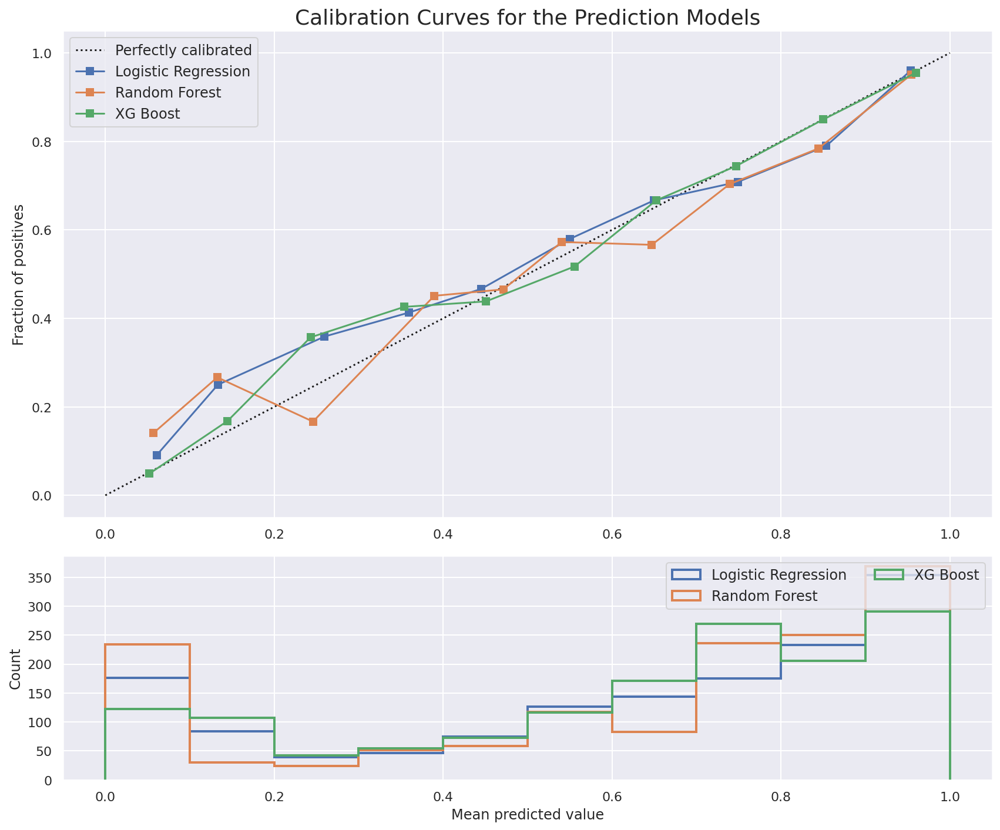

In [8]:
logit_prob, rf_prob, xgb_prob = prob_calibration(clf_dict, clf_cal_dict)

In [9]:
clf_cal_dict

{'Logistic Regression': CalibratedClassifierCV(cv=3,
                        estimator=LogisticRegression(C=0.002364489412645407,
                                                     max_iter=3000, penalty='l1',
                                                     random_state=8,
                                                     solver='liblinear')),
 'Random Forest': CalibratedClassifierCV(cv=3,
                        estimator=RandomForestClassifier(class_weight={0: 0.6,
                                                                       1: 0.4},
                                                         max_depth=15,
                                                         max_features='log2',
                                                         min_samples_split=130,
                                                         n_estimators=125,
                                                         random_state=1000),
                        method='isotonic'),
 'XG Boost': 

In [10]:
pred_probabilities = pd.DataFrame(
                                {'Logistic Regression': logit_prob,
                                'Random Forest': rf_prob,
                                'XG Boost': xgb_prob
                                })

In [11]:
# Predicted probabilities DataFrame from uncalibrated training set
pred_probabilities

,Logistic Regression,Random Forest,XG Boost
0,0.985834,0.958418,0.992811
1,0.035228,0.000000,0.000888
2,0.967315,0.941699,0.931075
3,0.942869,0.908955,0.875205
4,0.661268,0.624871,0.692220
...,...,...,...
5801,0.903681,0.832942,0.656528
5802,0.617698,0.390900,0.493885
5803,0.396484,0.500001,0.350540
5804,0.989531,0.994189,1.000000


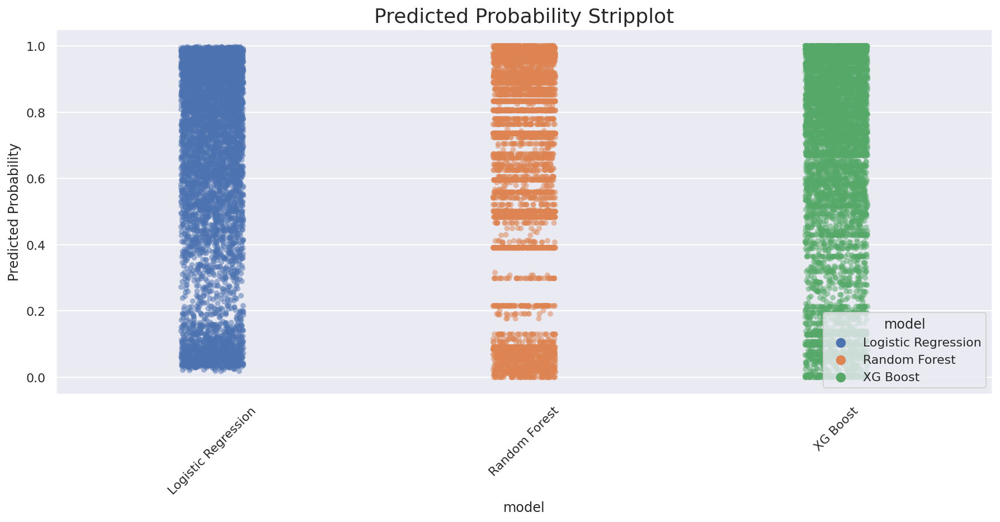

In [12]:
# Certain clusters of neighbourhoods do share similar distributions of 'SalePrice' and/or 'PriceSF'
fig, ax = plt.subplots(figsize=(15,6))

df_melt = pd.melt(pred_probabilities, var_name='model', value_name='probabilities')
sns.stripplot(x='model', y='probabilities', data=df_melt, hue='model', jitter=0.1, alpha=0.5, ax=ax)

ax.set_ylabel("Predicted Probability")
#ax.legend(loc="upper right", fontsize=11)
ax.set_ylim([-0.05, 1.05])
plt.title('Predicted Probability Stripplot', fontsize=18)
plt.xticks(rotation=45)
plt.show()

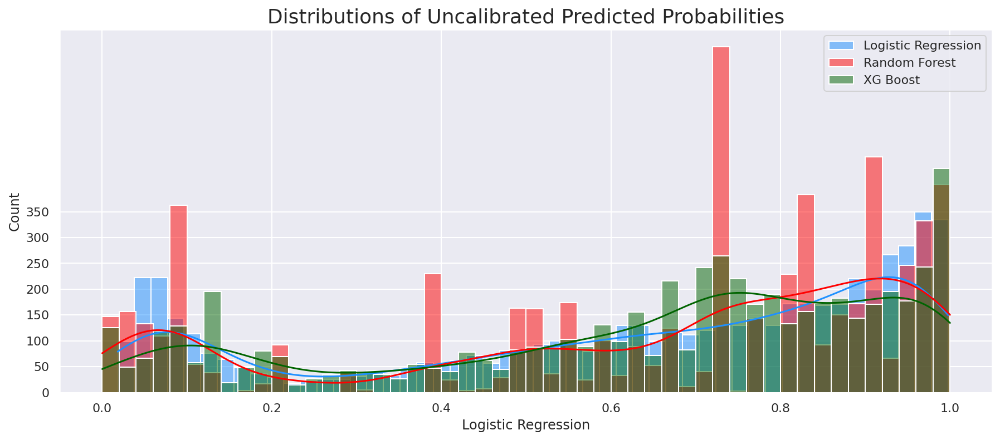

In [13]:
fig, ax = plt.subplots(figsize=(15,6))

sns.histplot(pred_probabilities['Logistic Regression'], bins=50, kde=True, ax=ax, color='dodgerblue', 
             label='Logistic Regression')
sns.histplot(pred_probabilities['Random Forest'], bins=50, kde=True, ax=ax, color='red', 
             label='Random Forest')
sns.histplot(pred_probabilities['XG Boost'], bins=50, kde=True, ax=ax, color='darkgreen', 
             label='XG Boost')

ax.yaxis.set_ticks(np.arange(0.00, 400, 50))
ax.legend(loc="center", fontsize=12)
plt.title('Distributions of Uncalibrated Predicted Probabilities', fontsize=18)
plt.legend();

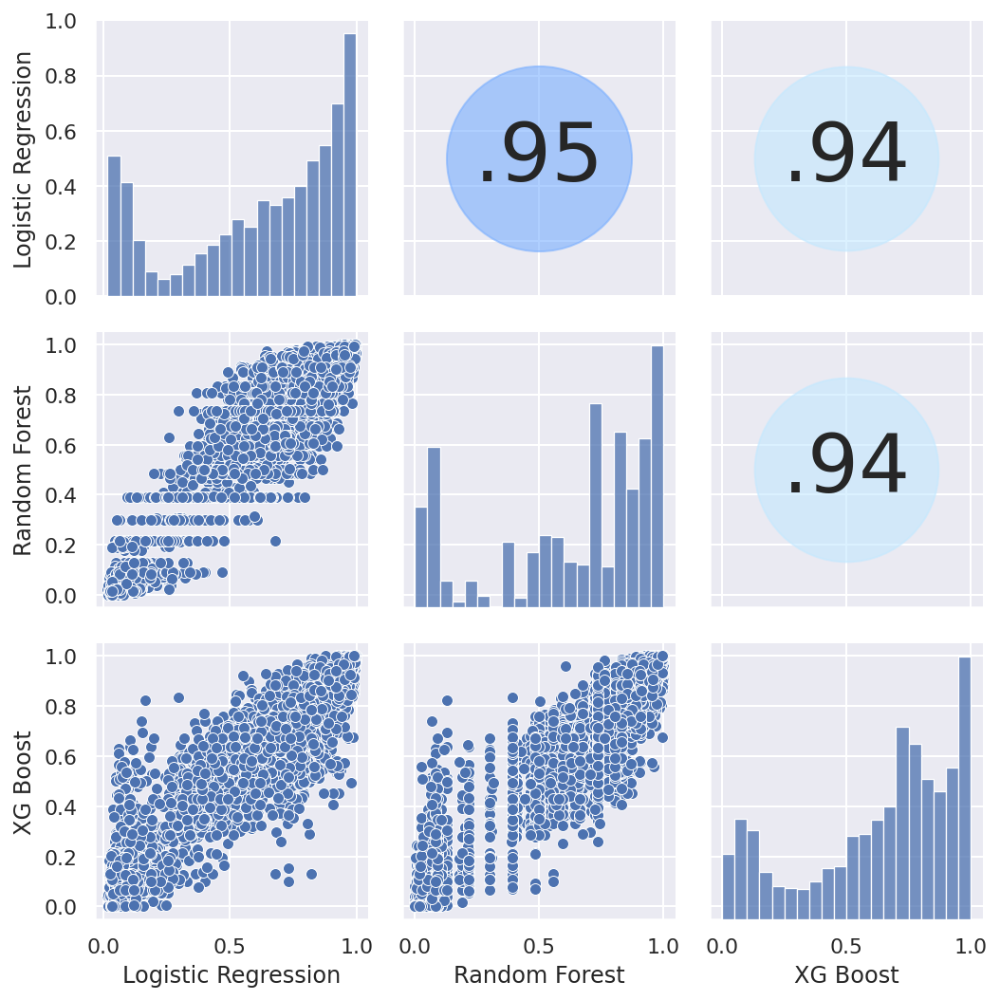

In [14]:
df = pred_probabilities
g = sns.PairGrid(df, diag_sharey=False)
g.axes[0, 0].set_ylim(0, 1)

colors = sns.color_palette("bright", 3)
def corrdot(*args, **kwargs):
    corr_r = args[0].corr(args[1], 'pearson')
    corr_text = f"{corr_r:2.2f}".replace("0.", ".")
    ax = plt.gca()
#     ax.set_axis_off()
    marker_size = abs(corr_r) * 10000
    ax.scatter([.5], [.5], marker_size, [corr_r], alpha=0.6, cmap="flag",
               vmin=-1, vmax=1, transform=ax.transAxes)
    font_size = abs(corr_r) * 40 + 5
    ax.annotate(corr_text, [.5, .5,],  xycoords="axes fraction",
                ha='center', va='center', fontsize=font_size)

    
    
    # Add scatter plots to the lower triangle
g.map_lower(sns.scatterplot)


# Add correlation scores to the upper triangle
g.map_upper(corrdot, annot=True, cmap='plasma', vmin=-1, vmax=1)

# Add histograms to the diagonal
g.map_diag(sns.histplot, kde = False, bins = 20, palette=colors)



# Set axis labels and titles
# g.set_axis_labels('', '')
# g.fig.suptitle('Comparison of Model Predicted Probabilities', fontsize=16, y=1.05)

# Adjust spacing between plots
g.fig.tight_layout()

# Show the plot
# plt.show()
plt.savefig("img/probability.png", dpi=500)

### Save Models

In [15]:
# Store coefficients
def get_coefs_df(X, coefs, index=None, sort=True):
    coefs_df = pd.DataFrame(np.std(X, 0) * coefs)
    coefs_df.columns = ["coef_std"]
    coefs_df['coef'] = coefs
    coefs_df['abs'] = coefs_df.coef_std.apply(abs)
    if index is not None:
        coefs_df.index = index
    if sort:
        coefs_df = coefs_df.sort_values('abs', ascending=False)
    return coefs_df

# Create DataFrame of feature importances
def get_feat_imp_df(feat_imps, index=None, sort=True):
    feat_imps = pd.DataFrame(feat_imps, columns=['importance'])
    if index is not None:
        feat_imps.index = index
    if sort:
        feat_imps = feat_imps.sort_values('importance', ascending=False)
    return feat_imps

#### Logistic Regression

CPU times: user 527 ms, sys: 1.77 s, total: 2.3 s
Wall time: 207 ms
CPU times: user 13.8 ms, sys: 76.9 ms, total: 90.7 ms
Wall time: 6.05 ms
In-sample score: 84.47%


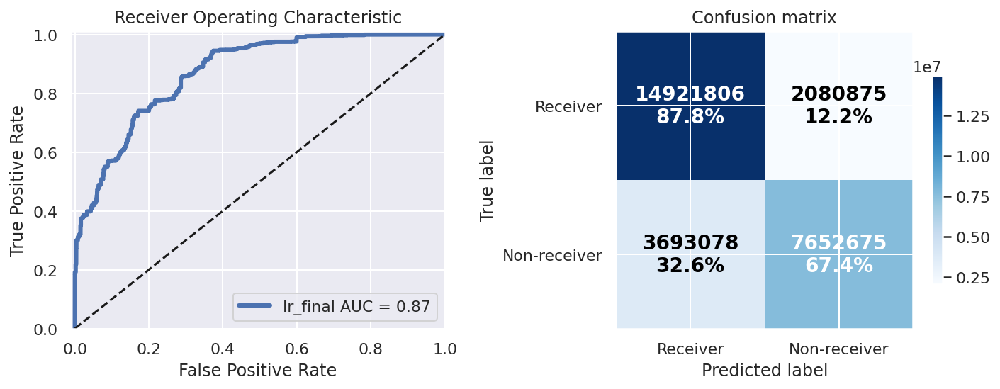

,lr_final
accuracy,0.796322
recall,0.877615
precision,0.801606
f1,0.837890
cross_entropy,0.427212
roc_auc,0.871574
cohen_kappa,0.502633


In [16]:
ALGORITHM_NAME = 'lr'
COUNTRY = 'best models'

model = CalibratedClassifierCV(cv=3,
                        estimator=LogisticRegression(C=0.002364489412645407,
                                                     max_iter=3000, penalty='l1',
                                                     random_state=8,
                                                     solver='liblinear'))

%time model.fit(X_train_log, y_train_log, sample_weight=w_train_log)

# Get an initial score
%time score = model.score(X_train_log, y_train_log, sample_weight=w_train_log)
print("In-sample score: {:0.2%}".format(score))
# coefs = get_coefs_df(X_train_log, model.coef_[0])['abs']



# # Run the model
y_pred = model.predict(X_test_log)
y_prob = model.predict_proba(X_test_log)[:,1]


# Evaluate performance and store model
metrics = evaluation.evaluate_model(y_test_log, y_pred, y_prob, w_test_log,
                                    store_model=True,
                                    model_name='final', 
                                    prefix=ALGORITHM_NAME,
                                    country=COUNTRY,
                                    model=model, 
                                    features=X_test_log.columns.values,
                                    predict_dig_wage_rate=False)

#### Random Forest

CPU times: user 537 ms, sys: 0 ns, total: 537 ms
Wall time: 537 ms
CPU times: user 105 ms, sys: 0 ns, total: 105 ms
Wall time: 105 ms
In-sample score: 84.50%


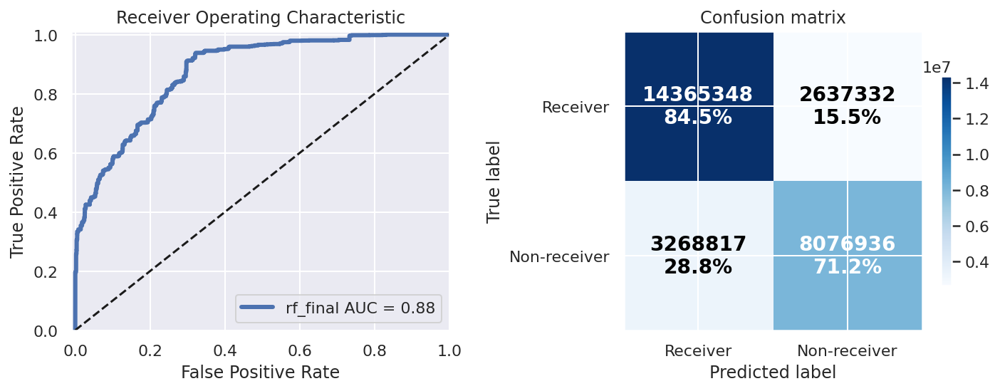

,rf_final
accuracy,0.791659
recall,0.844887
precision,0.814632
f1,0.829484
cross_entropy,0.429839
roc_auc,0.875281
cohen_kappa,0.481680


In [17]:
ALGORITHM_NAME = 'rf'
COUNTRY = 'best models'

model = CalibratedClassifierCV(cv=3,
                        estimator=RandomForestClassifier(class_weight={0: 0.6, 1: 0.4},
                                                         max_depth=15,
                                                         max_features='log2',
                                                         min_samples_split=130,
                                                         n_estimators=125,
                                                         random_state=1000))
                               
%time model.fit(X_train_rf, y_train_rf, sample_weight=w_train_rf)

# Get an initial score
%time score = model.score(X_train_rf, y_train_rf, w_train_rf)
print("In-sample score: {:0.2%}".format(score))
# feat_imps = get_feat_imp_df(model.feature_importances_, index=X_train.columns)

# Run the model
y_pred = model.predict(X_test_rf)
y_prob = model.predict_proba(X_test_rf)[:,1]

# Evaluate performance and store model
metrics = evaluation.evaluate_model(y_test_rf, y_pred, y_prob, w_test_rf,
                                    store_model=True,
                                    model_name='final', 
                                    prefix=ALGORITHM_NAME,
                                    country=COUNTRY,
                                    model=model,
#                                     features=feat_imps,
                                    predict_dig_wage_rate=False)

#### XGBoost

CPU times: user 1.23 s, sys: 0 ns, total: 1.23 s
Wall time: 86.7 ms
CPU times: user 57.6 ms, sys: 0 ns, total: 57.6 ms
Wall time: 4.08 ms
In-sample score: 84.18%


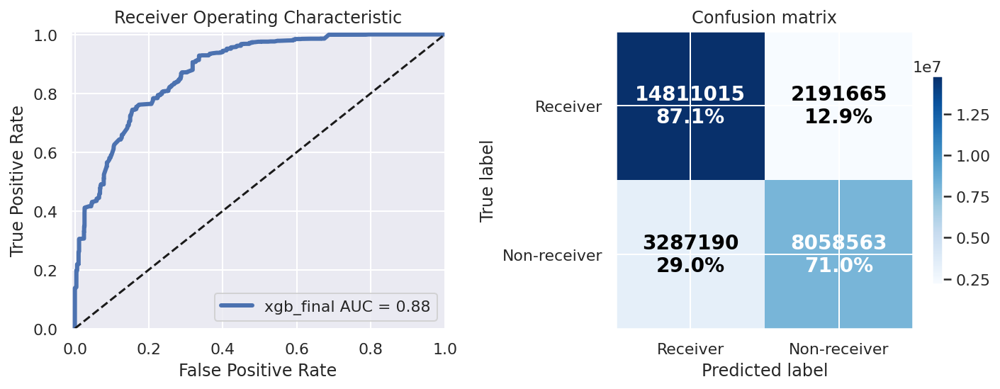

,xgb_final
accuracy,0.806732
recall,0.871099
precision,0.818369
f1,0.843911
cross_entropy,0.412976
roc_auc,0.878330
cohen_kappa,0.497999


In [18]:
ALGORITHM_NAME = 'xgb'
COUNTRY = 'best models'

model = CalibratedClassifierCV(cv=3,
                        estimator=XGBClassifier(tree_method="hist", 
                                                objective='binary:logistic',
                                                base_score=None,
                                                booster='gbtree', callbacks=None,
                                                colsample_bylevel=None,
                                                colsample_bynode=None,
                                                colsample_bytree=None,
                                                early_stopping_rounds=None,
                                                enable_categorical=True,
                                                eval_metric='logloss',
                                                feature_types=None, gamma=100,
                                                gpu_id=None, grow_policy=None,
                                                importance_type=None,
                                                interaction_constraints=None,
                                                learning_rate=0.2, max_bin=None,
                                                max_cat_threshold=None,
                                                max_cat_to_onehot=1,
                                                max_delta_step=5, max_depth=None,
                                                max_leaves=None,
                                                min_child_weight=None,
                                                monotone_constraints=None,
                                                n_estimators=25, n_jobs=None,
                                                num_parallel_tree=None,
                                                predictor=None,
                                                random_state=None),
                        method='isotonic')

%time model.fit(X_train_xgb, y_train_xgb, sample_weight=w_train_xgb)

# Get an initial score
%time score = model.score(X_train_xgb, y_train_xgb)
print("In-sample score: {:0.2%}".format(score))
# feat_imps = get_feat_imp_df(model.feature_importances_, index=X_train.columns)


# Run the model
y_pred = model.predict(X_test_xgb)
y_prob = model.predict_proba(X_test_xgb)[:,1]

# Evaluate performance and store model
metrics = evaluation.evaluate_model(y_test_xgb, y_pred, y_prob, w_test_xgb, 
                                    store_model=True,
                                    model_name='final', 
                                    prefix=ALGORITHM_NAME,
                                    country=COUNTRY,
                                    model=model,
#                                     features=feat_imps,
                                    predict_dig_wage_rate=False)

### Final Models Summary

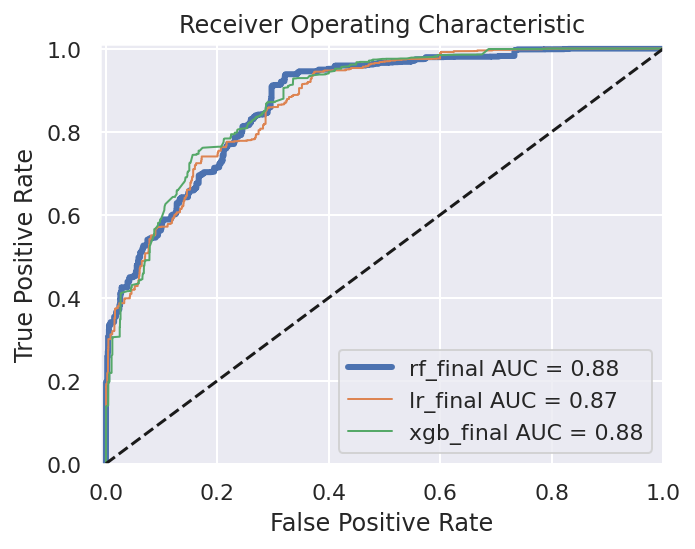

,accuracy,recall,precision,f1,cross_entropy,roc_auc,cohen_kappa
rf_final,0.791659,0.844887,0.814632,0.829484,0.429839,0.875281,0.481680
lr_final,0.796322,0.877615,0.801606,0.837890,0.427212,0.871574,0.502633
xgb_final,0.806732,0.871099,0.818369,0.843911,0.412976,0.878330,0.497999


In [19]:
evaluation.compare_algorithm_models(ALGORITHM_NAME, COUNTRY)

## Model Evaluation

### XGBoost

In [295]:
#XGBoost
# Load and transform the training data
X_train_xgb, y_train_xgb, w_train_xgb = split_features_labels_weights(TRAIN_PATH)
# X_train_xgb = X_train_xgb.to_numpy()
# w_train_xgb = w_train_xgb.to_numpy().reshape(-1)
# y_train_xgb = y_train_xgb.to_numpy().reshape(-1)
# Load the test set
X_test_xgb, y_test_xgb, w_test_xgb = split_features_labels_weights(TEST_PATH)
# X_test_xgb = X_test_xgb.to_numpy()
# w_test_xgb = w_test_xgb.to_numpy().reshape(-1)
# y_test_xgb = y_test_xgb.to_numpy().reshape(-1)

In [296]:
def evaluate_model_by_demographic(model, x_test, y_test, demographic_feature):
    # Subset x_test and y_test based on the values of the demographic feature
    unique_values = x_test[demographic_feature].unique()
    subsets_x_test = [x_test[x_test[demographic_feature] == value] for value in unique_values]
    subsets_y_test = [y_test[x_test[demographic_feature] == value] for value in unique_values]
    
    # Evaluate the model's accuracy on each subset
    accuracy_scores = []
    subset_counts = []
    for i in range(len(unique_values)):
        x_subset = subsets_x_test[i].to_numpy()
        y_subset = subsets_y_test[i].to_numpy().reshape(-1)
        y_pred = model.predict(x_subset)
        accuracy_scores.append(accuracy_score(y_subset, y_pred))
        subset_counts.append(len(x_subset))
    
    # Create a dataframe of accuracy scores and their corresponding subset descriptions
    accuracy_df = pd.DataFrame({'subset_description': unique_values, 'subset_count': subset_counts, 'accuracy': accuracy_scores})
    
    return accuracy_df


In [297]:
accuracy_df = evaluate_model_by_demographic(model, X_test_xgb, y_test_xgb, 'account')
print(accuracy_df)

  subset_description  subset_count  accuracy
0                  1          1163  0.753224
1                  0           289  0.242215


In [23]:
countries = ["Uganda", "Kenya", "Ghana", "Tanzania", "Namimbia", "Zambia", "Nigeria", "Congo", "Liberia",
             "Benin", "Togo", "South Sudan", "Zimbambwe", "Guinea", "Senegal", "South Africa", "Malawi",
            "Tunisia", "Mozambique", "Mali", "Egypt", "Côte d'Ivoire", "burkina Faso", "Cameroon", "Sierra Leone"]

In [24]:
accuracy = accuracy_df.accuracy.to_list()

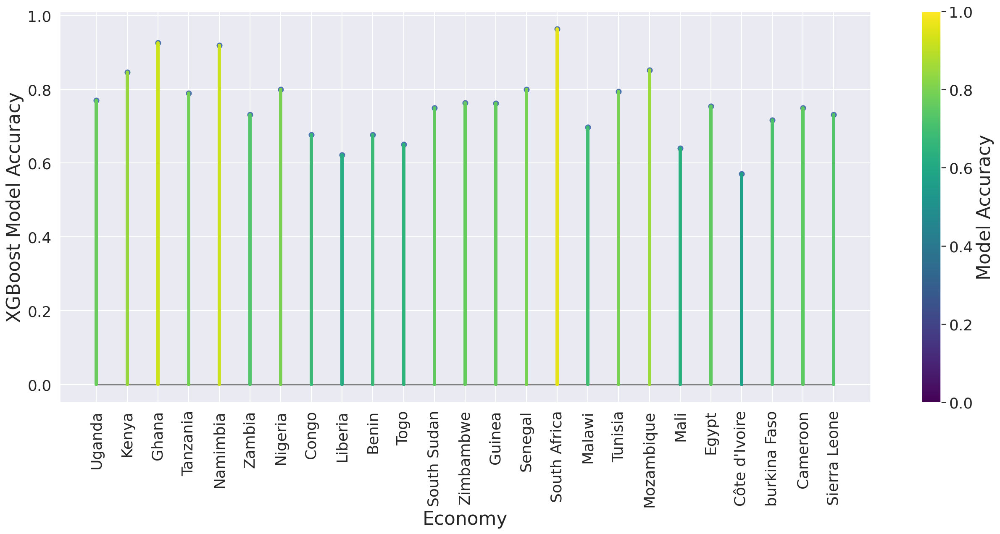

In [75]:

# Create some example data
# countries = accuracy_df.subset_description#['USA', 'Canada', 'Mexico', 'Brazil', 'Argentina']
# countries = accuracy_df.subset_description.to_list()
accuracy = accuracy_df.accuracy.to_list()

# Define a color map based on the accuracy values
cmap = plt.cm.get_cmap('viridis')
colors = cmap(accuracy)

# Create a stem plot
fig, ax = plt.subplots(figsize=(18, 9))
ax.stem(countries, accuracy, markerfmt='o', use_line_collection=True, linefmt='grey', basefmt='grey')

# Set the color of the stems based on the accuracy values
for i, (c, a) in enumerate(zip(countries, accuracy)):
    ax.plot([c, c], [0, a], color=colors[i], linewidth=4)

# Add a color bar to show the mapping of accuracy values to colors
sm = plt.cm.ScalarMappable(cmap=cmap)
sm.set_array([])
cbar = plt.colorbar(sm)
cbar.set_label('Model Accuracy', fontsize=22)
cbar.ax.tick_params(labelsize=18)

# Set the title and axis labels
# ax.set_title('Accuracy by Country')
ax.set_xlabel('Economy', fontsize=22)
ax.set_ylabel('XGBoost Model Accuracy' , fontsize=22)
ax.tick_params(axis='both', which='major', labelsize=18)
plt.xticks(rotation=90)
fig.set_tight_layout(True)

plt.savefig("img/economyplot.png")

### SHAP 

In [39]:
import shap
import xgboost
shap.initjs()

In [32]:
# dtrain = xgboost.DMatrix(X_train_xgb, label=y_train_xgb, weight = w_train_xgb, enable_categorical = True)
# dtest = xgboost.DMatrix(X_test_xgb, label=y_test_xgb, weight = w_test_xgb, enable_categorical = True)
# params =   {
#             "tree_method": "hist", 
#             "objective":'binary:logistic',
#             "base_score":None,
#             "booster":'gbtree', 
#             "callbacks":None,
#             "colsample_bylevel":None,
#             "colsample_bynode":None,
#             "colsample_bytree":None,
#             "early_stopping_rounds":None,
#             "enable_categorical":True,
#             "eval_metric":'logloss',
#             "feature_types":None, 
#             "gamma":100,
#             "gpu_id":None, 
#             "grow_policy":None,
#             "importance_type":None,
#             "interaction_constraints":None,
#             "learning_rate":0.2, 
#             "max_bin":None,
#             "max_cat_threshold":None,
#             "max_cat_to_onehot":1,
#             "max_delta_step":5, 
#             "max_depth":None,
#             "max_leaves":None,
#             "min_child_weight":None,
#             "monotone_constraints":None,
#             "n_estimators":25, 
#             "n_jobs":None,
#             "num_parallel_tree":None,
#             "predictor":None,
#             "random_state":None
#            }
# model = xgboost.train(params, dtrain, 5000, evals =[(dtest, "test")])

CPU times: user 1.35 s, sys: 0 ns, total: 1.35 s
Wall time: 108 ms
CPU times: user 185 ms, sys: 0 ns, total: 185 ms
Wall time: 10.2 ms
In-sample score: 86.52%


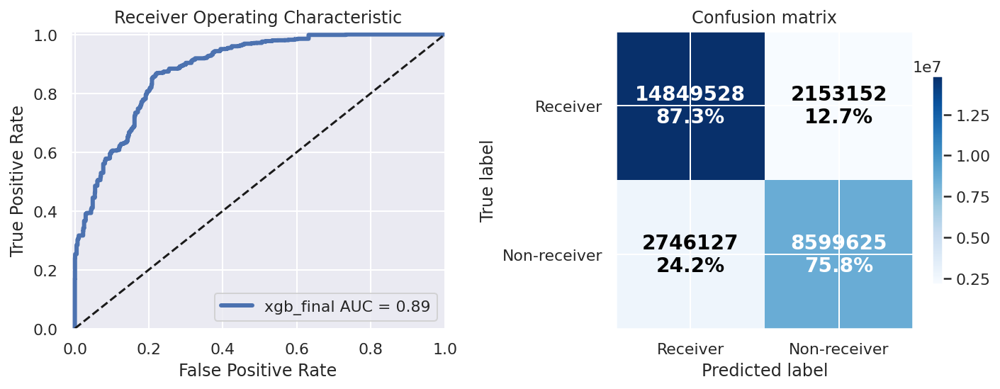

,xgb_final
accuracy,0.827176
recall,0.873364
precision,0.843932
f1,0.858396
cross_entropy,0.430164
roc_auc,0.885883
cohen_kappa,0.502402


In [198]:
model = XGBClassifier(tree_method="hist", 
                                                objective='binary:logistic',
                                                base_score=None,
                                                booster='gbtree', callbacks=None,
                                                colsample_bylevel=None,
                                                colsample_bynode=None,
                                                colsample_bytree=None,
                                                early_stopping_rounds=None,
                                                enable_categorical=True,
                                                eval_metric='logloss',
                                                feature_types=None, gamma=100,
                                                gpu_id=None, grow_policy=None,
                                                importance_type=None,
                                                interaction_constraints=None,
                                                learning_rate=0.2, max_bin=None,
                                                max_cat_threshold=None,
                                                max_cat_to_onehot=1,
                                                max_delta_step=5, max_depth=None,
                                                max_leaves=None,
                                                min_child_weight=None,
                                                monotone_constraints=None,
                                                n_estimators=25, n_jobs=None,
                                                num_parallel_tree=None,
                                                predictor=None,
                                                random_state=None)
%time model.fit(X_train_xgb, y_train_xgb, sample_weight=w_train_xgb)

# Get an initial score
%time score = model.score(X_train_xgb, y_train_xgb)
print("In-sample score: {:0.2%}".format(score))
# feat_imps = get_feat_imp_df(model.feature_importances_, index=X_train.columns)


# Run the model
y_pred = model.predict(X_test_xgb)
y_prob = model.predict_proba(X_test_xgb)[:,1]

# Evaluate performance and store model
metrics = evaluation.evaluate_model(y_test_xgb, y_pred, y_prob, w_test_xgb.to_numpy().reshape(-1), 
                                    store_model=False,
                                    model_name='final', 
                                    prefix=ALGORITHM_NAME,
                                    country=COUNTRY,
                                    model=model,
#                                     features=feat_imps,
                                    predict_dig_wage_rate=False)

In [180]:
explainer = shap.Explainer(model.predict, X_test_xgb)
shap_values = explainer(X_test_xgb)

Permutation explainer: 1453it [00:38, 29.54it/s]                          


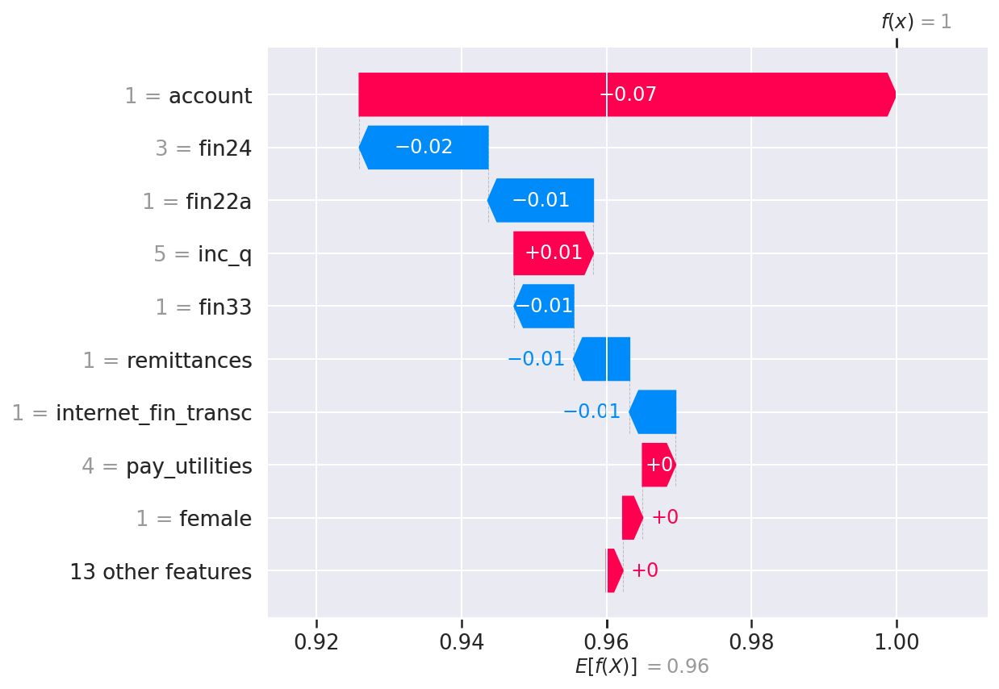

In [145]:
shap.plots.waterfall(shap_values[0])

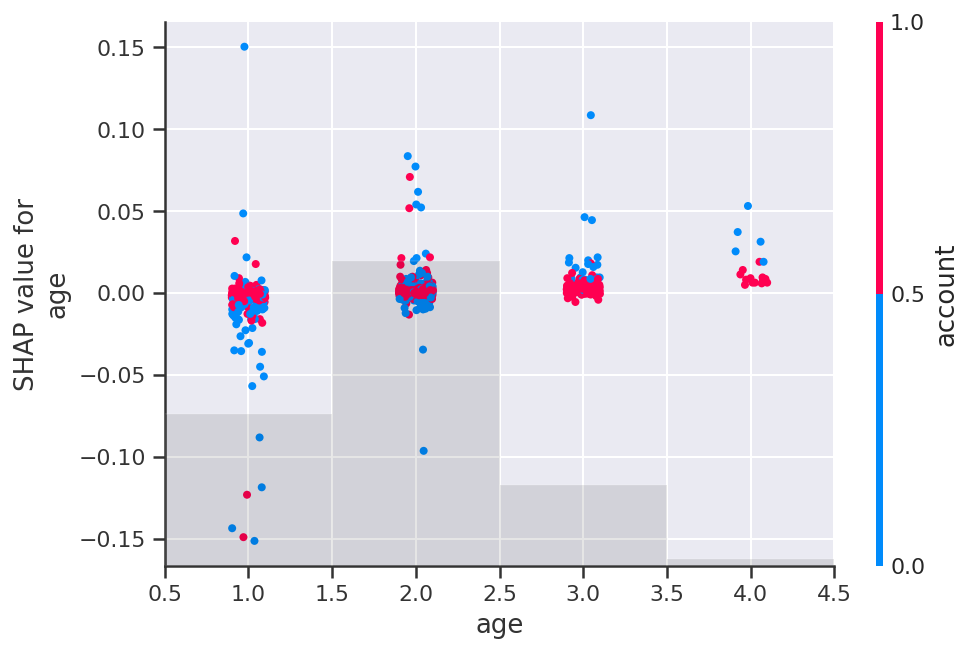

In [146]:
shap.plots.scatter(shap_values[:,'age'], color=shap_values)

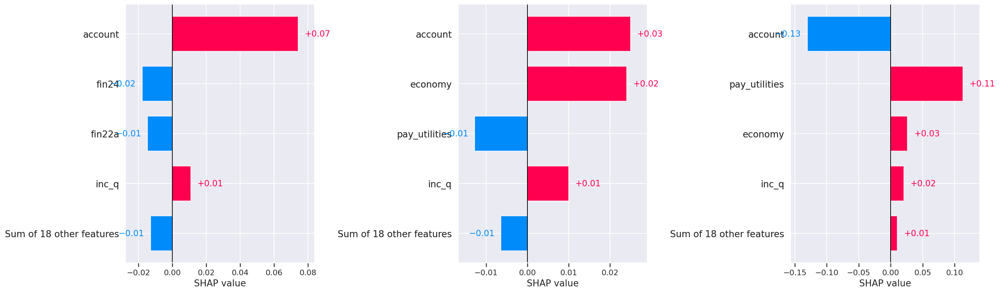

In [147]:
fig = plt.figure()
ax0 = fig.add_subplot(131)
shap.plots.bar(shap_values[0], max_display=5, show = False)
ax1 = fig.add_subplot(132)
shap.plots.bar(shap_values[1], max_display=5, show = False)
ax2 = fig.add_subplot(133)
shap.plots.bar(shap_values[2], max_display=5, show = False)
plt.gcf().set_size_inches(20,6)
plt.tight_layout() 
plt.show()

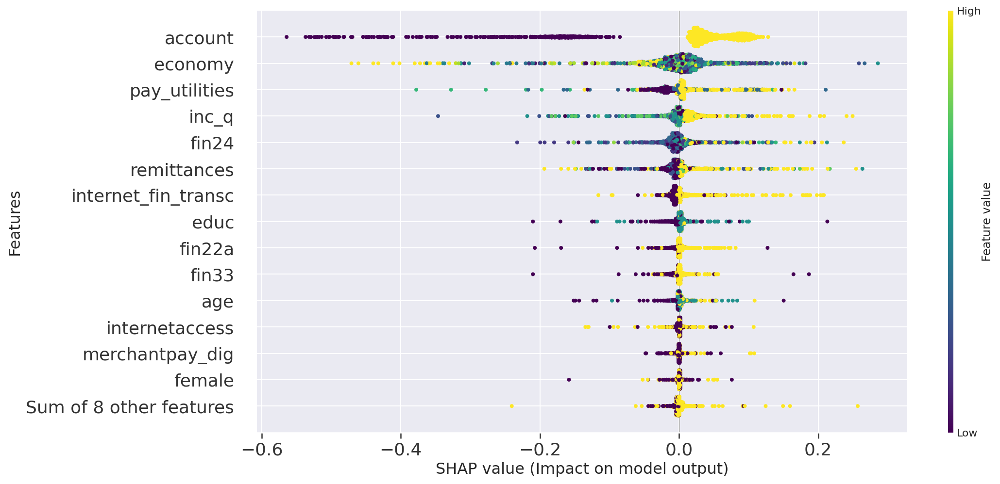

In [144]:
# shap.force_plot(explainer.expected_value, shap_values[0,:], X_display.iloc[0,:])
fig, ax = plt.subplots(figsize=(18, 20))
shap.plots.beeswarm(shap_values, max_display=15, plot_size=(15,8), color =plt.get_cmap("viridis"), show = False)
plt.xlabel("SHAP value (Impact on model output)", fontsize=16)
plt.ylabel("Features", fontsize=16)
ax.tick_params(axis='both', which='major', labelsize=18)

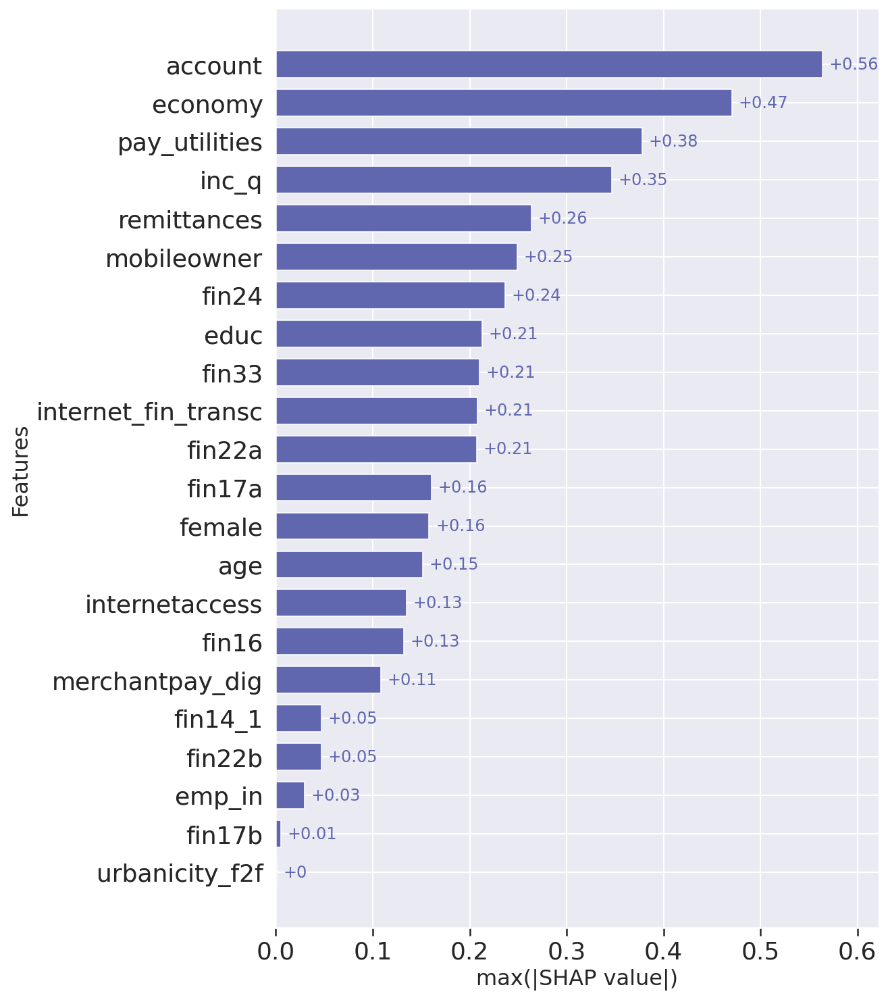

In [148]:
plt.figure(figsize=(18, 20))
shap.plots.bar(shap_values.abs.max(0), max_display=30, show = False)
plt.xlabel("max(|SHAP value|)", fontsize=16)
plt.ylabel("Features", fontsize=16)
plt.tick_params(axis='both', which='major', labelsize=18)

import matplotlib

# Default SHAP colors
default_pos_color = "#ff0051"
default_neg_color = "#008bfb"
# Custom colors
positive_color = "#6067af"
negative_color = "#2eab19"

# Change the colormap of the artists
for fc in plt.gcf().get_children():
    # Ignore last Rectangle
    for fcc in fc.get_children()[:-1]:
        if (isinstance(fcc, matplotlib.patches.Rectangle)):
            if (matplotlib.colors.to_hex(fcc.get_facecolor()) == default_pos_color):
                fcc.set_facecolor(positive_color)
            elif (matplotlib.colors.to_hex(fcc.get_facecolor()) == default_neg_color):
                fcc.set_color(negative_color)
        elif (isinstance(fcc, plt.Text)):
            if (matplotlib.colors.to_hex(fcc.get_color()) == default_pos_color):
                fcc.set_color(positive_color)
            elif (matplotlib.colors.to_hex(fcc.get_color()) == default_neg_color):
                fcc.set_color(negative_color)
plt.show()

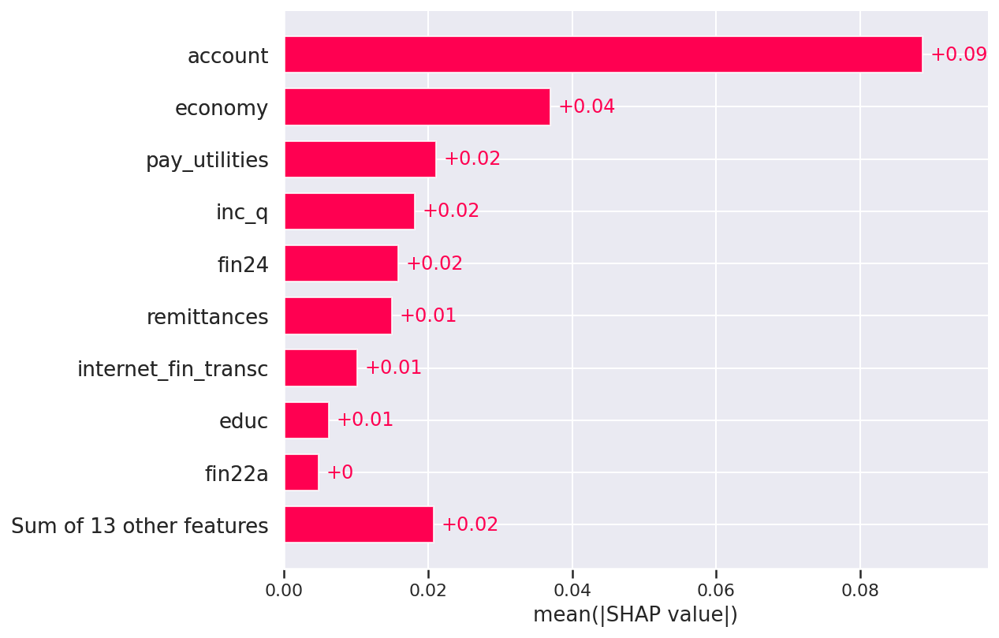

In [171]:
# sex =["Women" if shap_values[i, "female"].data == 1 else "Men" for i in range(shap_values.shape[0])]
# shap.plots.bar(shap_values.cohorts(sex).abs.mean(0))
# account =["Owner" if shap_values[i, "account"].data == 1 else "Not-owner" for i in range(shap_values.shape[0])]
# shap.plots.bar(shap_values.cohorts(account).abs.mean(0))
economy =["K" if shap_values[i, "economy"].data == "Ghana" else "Not-K" for i in range(shap_values.shape[0])]
shap.plots.bar(shap_values.cohorts(economy).abs.mean(0))

`early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
No/low signal found from feature 1 (this is typically caused by constant or near-constant features)! Cluster distances can't be computed for it (so setting all distances to 1).
No/low signal found from feature 5 (this is typically caused by constant or near-constant features)! Cluster distances can't be computed for it (so setting all distances to 1).


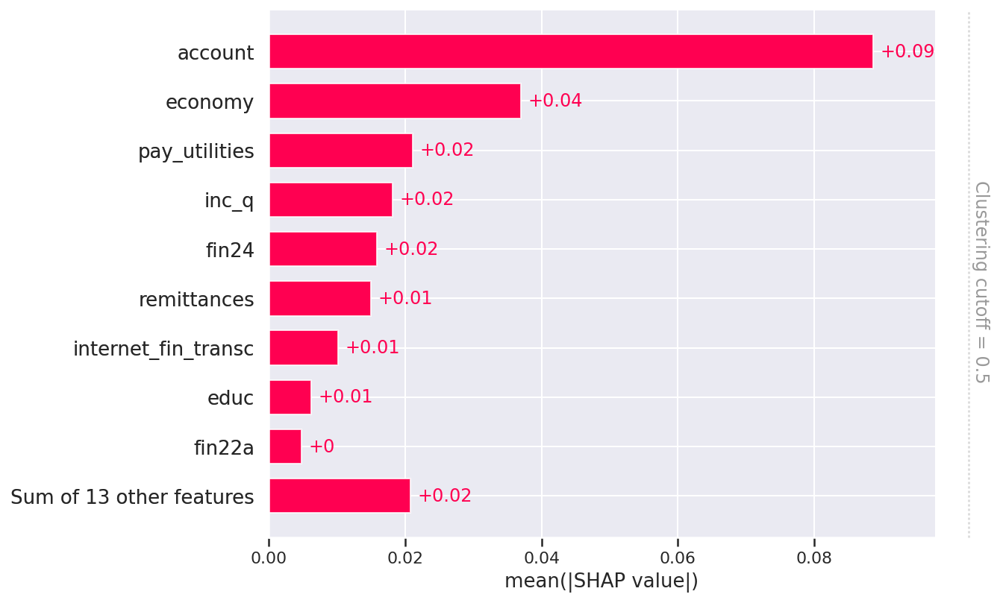

In [152]:
clustering = shap.utils.hclust(X_train_xgb, y_train_xgb) # by default this trains (X.shape[1] choose 2) 2-feature XGBoost models
shap.plots.bar(shap_values, clustering=clustering)

<IPython.core.display.Javascript object>


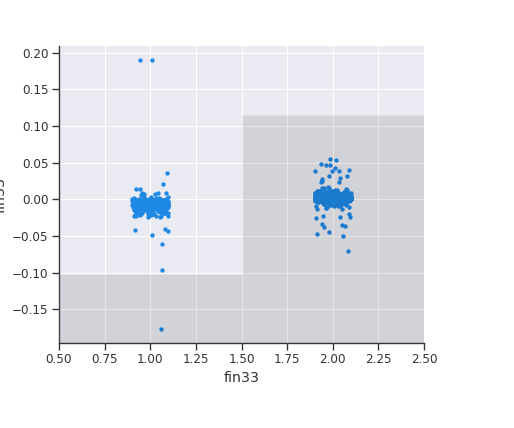

In [452]:
shap.plots.scatter(shap_values[:,"fin33"])

In [430]:
# from matplotlib.colors import LinearSegmentedColormap
# from matplotlib.ticker import MaxNLocator
# cdict1 = {
#     'red': ((0.0, 0.11764705882352941, 0.11764705882352941),
#             (1.0, 0.9607843137254902, 0.9607843137254902)),

#     'green': ((0.0, 0.5333333333333333, 0.5333333333333333),
#               (1.0, 0.15294117647058825, 0.15294117647058825)),

#     'blue': ((0.0, 0.8980392156862745, 0.8980392156862745),
#              (1.0, 0.3411764705882353, 0.3411764705882353)),

#     'alpha': ((0.0, 1, 1),
#               (0.5, 1, 1),
#               (1.0, 1, 1))
# }  # #1E88E5 -> #ff0052
# red_blue_solid = LinearSegmentedColormap('RedBlue', cdict1)
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap

# Get the "viridis" colormap
viridis_cmap = plt.cm.get_cmap('winter')

# Define the new colormap using colors from "viridis"
red_blue_solid = LinearSegmentedColormap.from_list('RedBlue', [viridis_cmap(0), viridis_cmap(viridis_cmap.N - 1)])

<IPython.core.display.Javascript object>


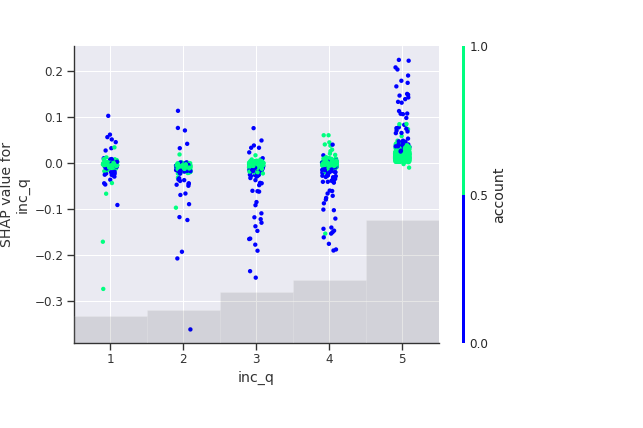

In [436]:
shap.plots.scatter(shap_values[:, "inc_q"], color=shap_values[:,"account"], cmap = viridis_cmap)

<IPython.core.display.Javascript object>


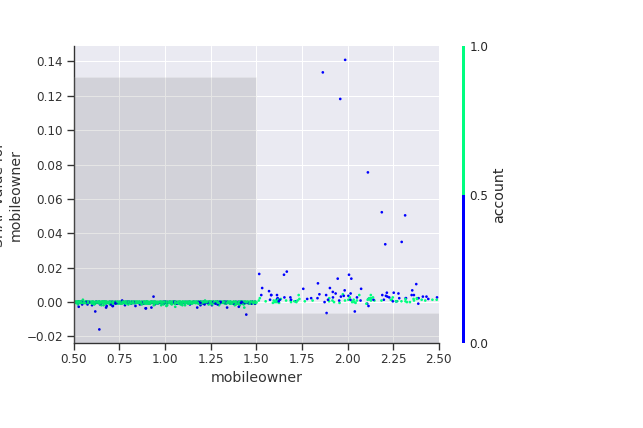

<IPython.core.display.Javascript object>


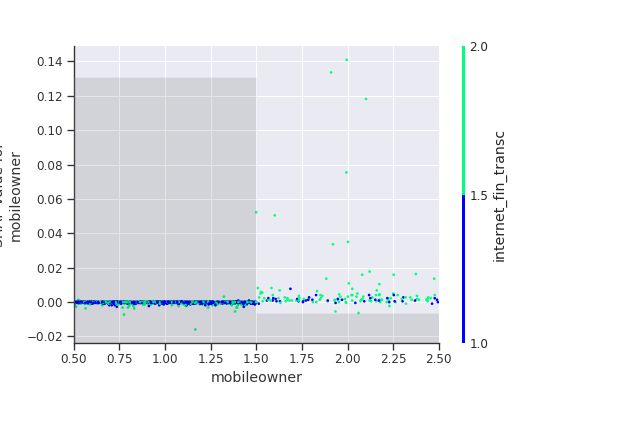

<IPython.core.display.Javascript object>


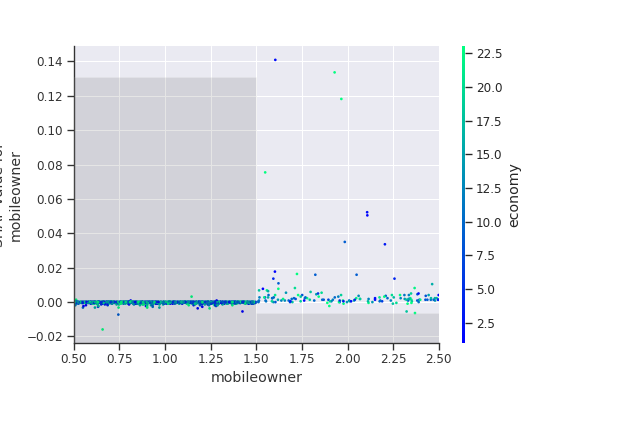

<IPython.core.display.Javascript object>


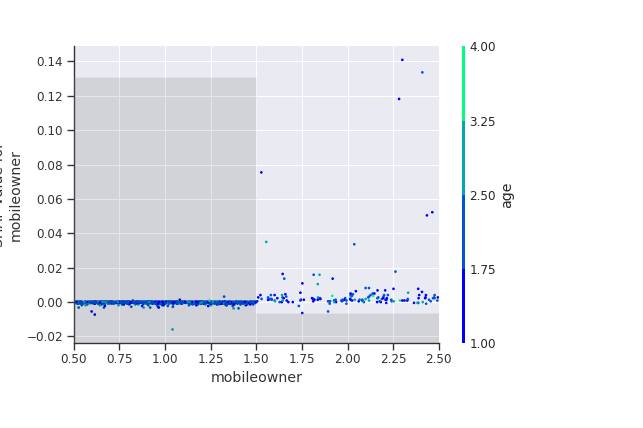

<IPython.core.display.Javascript object>


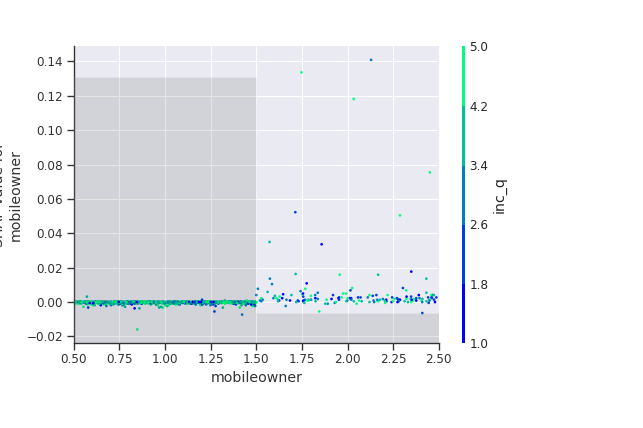

<IPython.core.display.Javascript object>


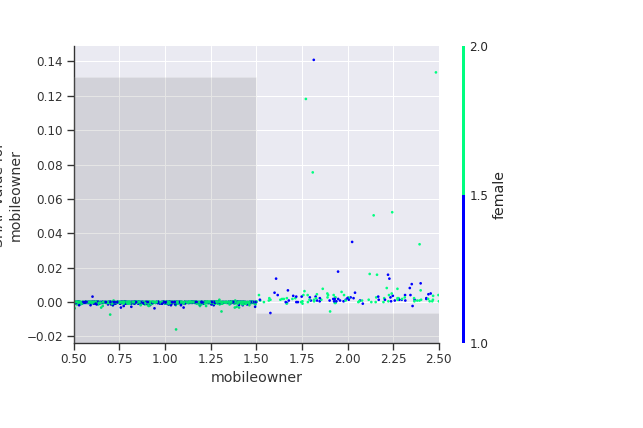

<IPython.core.display.Javascript object>


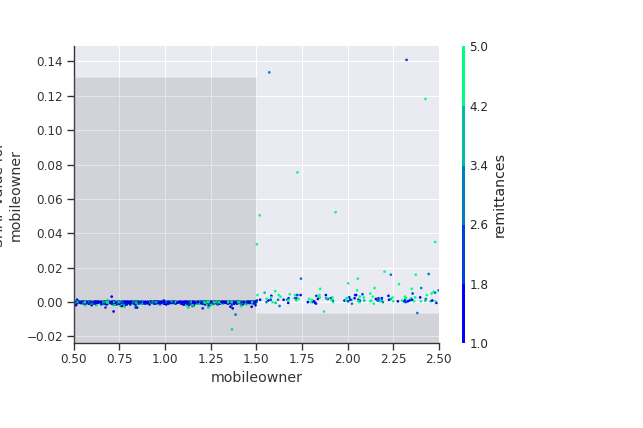

<IPython.core.display.Javascript object>


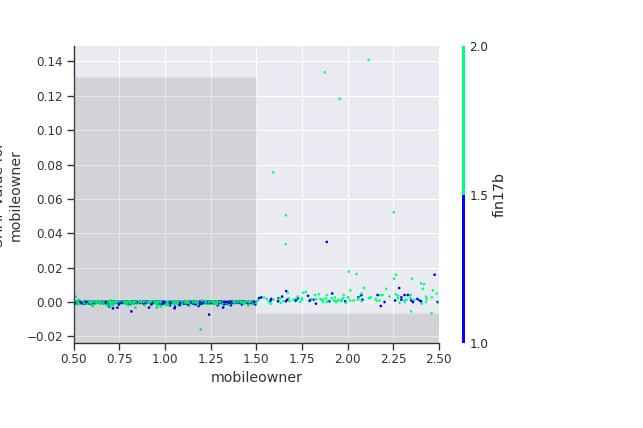

<IPython.core.display.Javascript object>


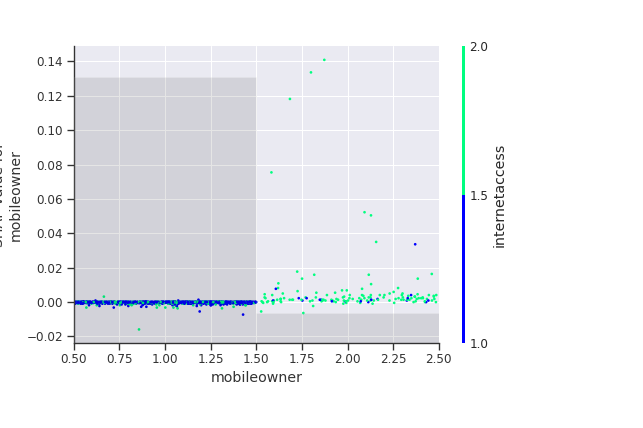

<IPython.core.display.Javascript object>


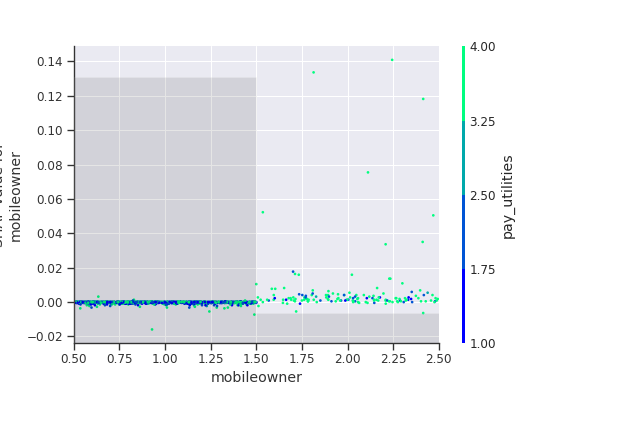

<IPython.core.display.Javascript object>


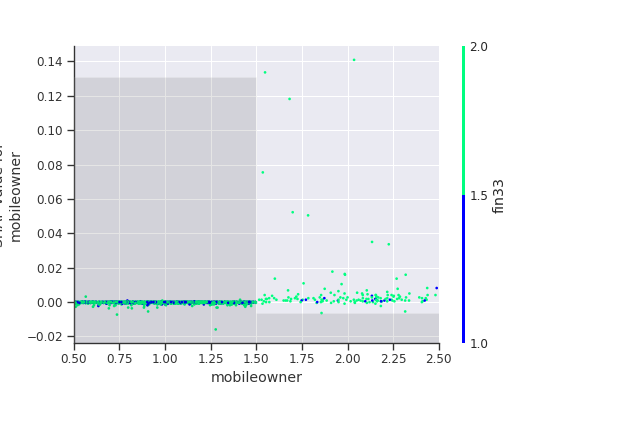

<IPython.core.display.Javascript object>


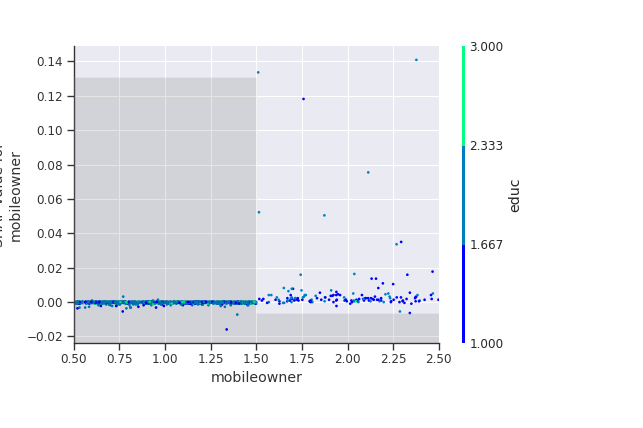

<IPython.core.display.Javascript object>


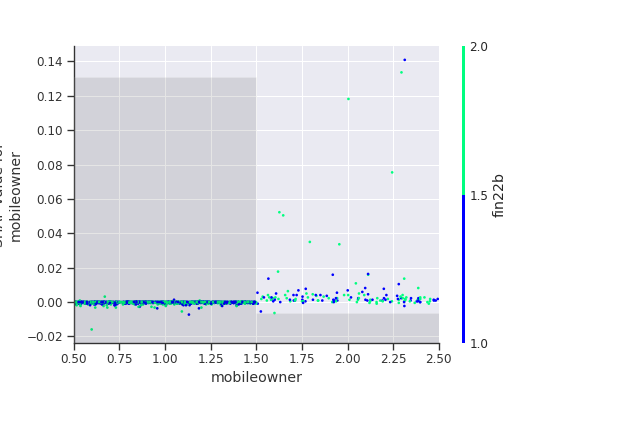

<IPython.core.display.Javascript object>


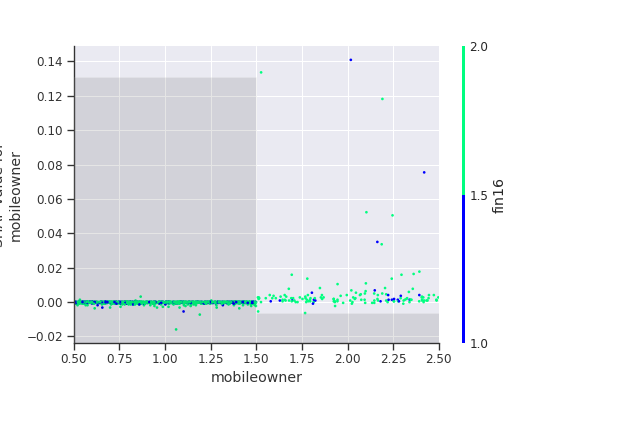

<IPython.core.display.Javascript object>


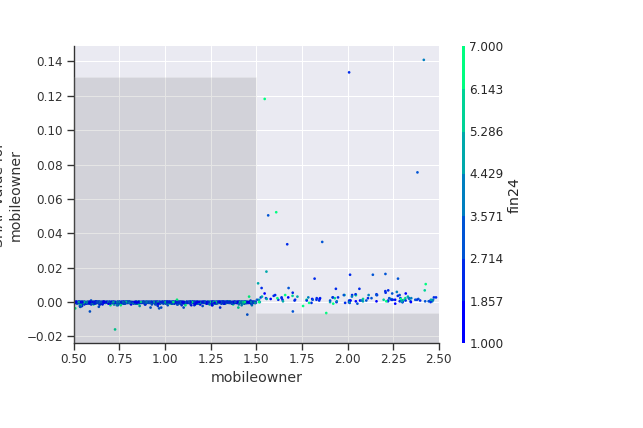

<IPython.core.display.Javascript object>


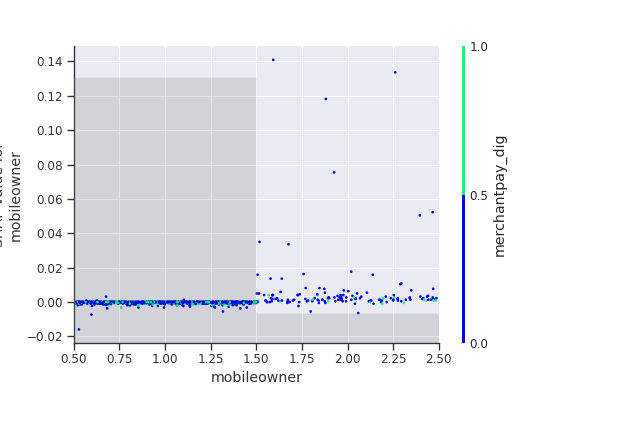

<IPython.core.display.Javascript object>


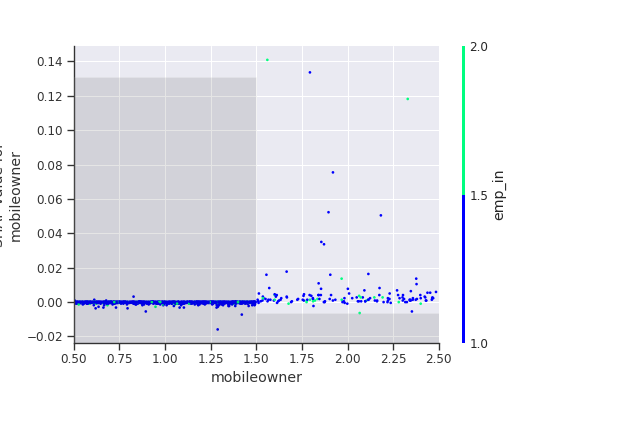

<IPython.core.display.Javascript object>


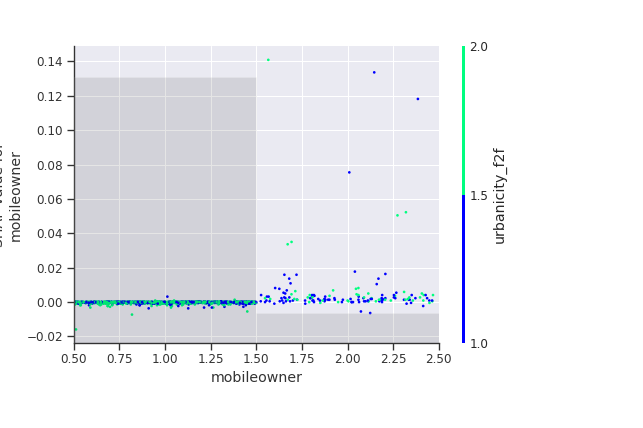

<IPython.core.display.Javascript object>


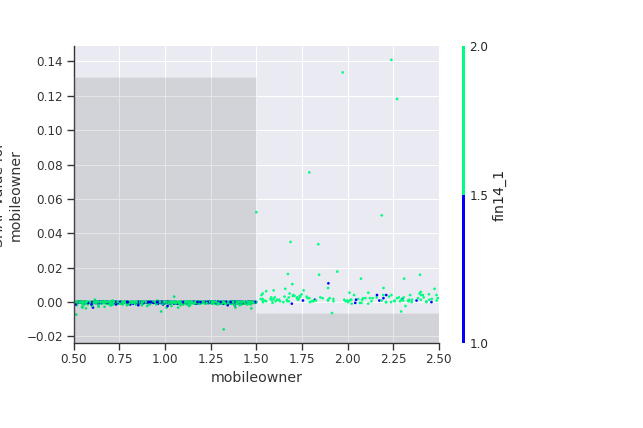

<IPython.core.display.Javascript object>


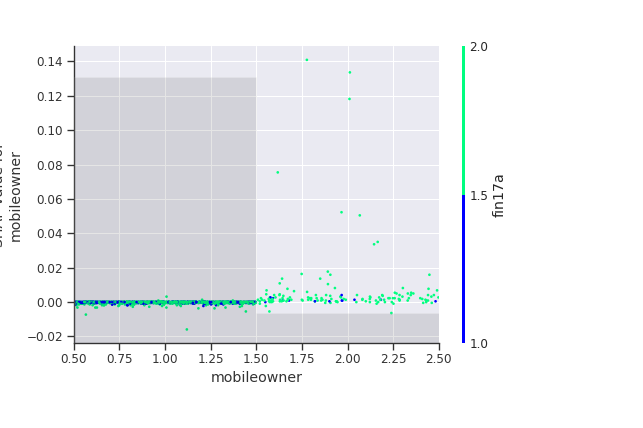

<IPython.core.display.Javascript object>


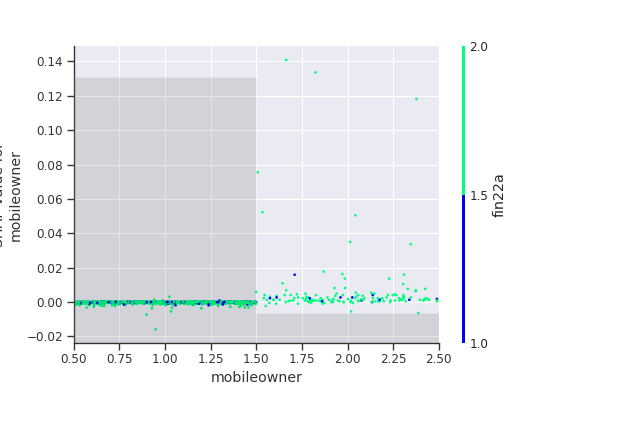

<IPython.core.display.Javascript object>


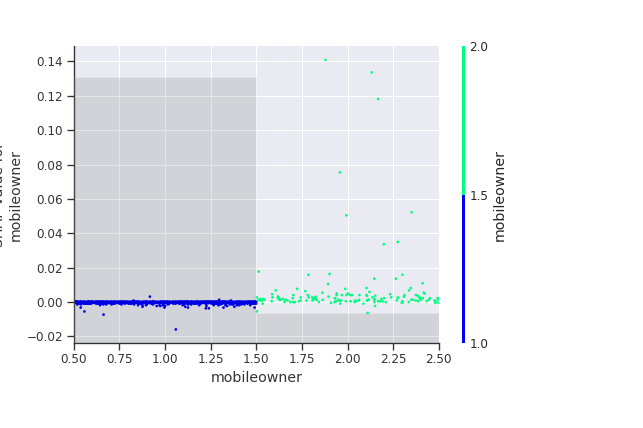

In [454]:
inds = shap.utils.potential_interactions(shap_values[:, "mobileowner"], shap_values)

# make plots colored by each of the top three possible interacting features
for i in range(22):
    shap.plots.scatter(shap_values[:,"mobileowner"], color=shap_values[:,inds[i]], cmap = viridis_cmap, dot_size=6, x_jitter=1, show = False)
plt.savefig('img/educinteraction.png')

<IPython.core.display.Javascript object>


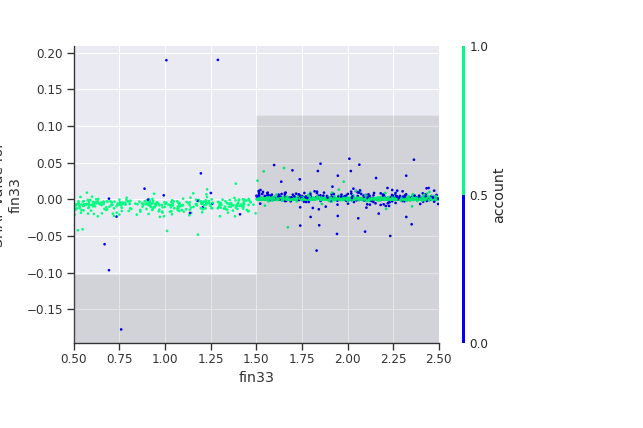

<IPython.core.display.Javascript object>


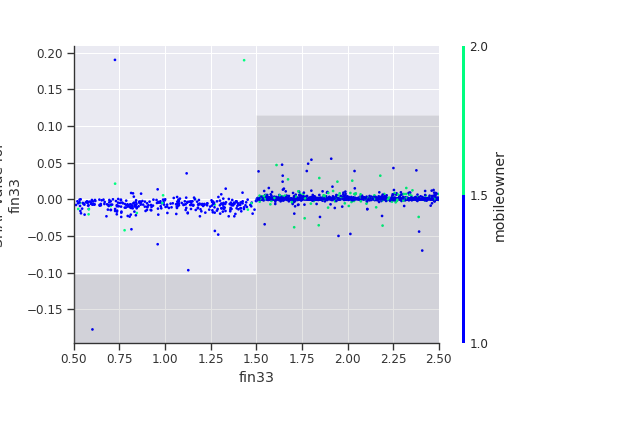

<IPython.core.display.Javascript object>


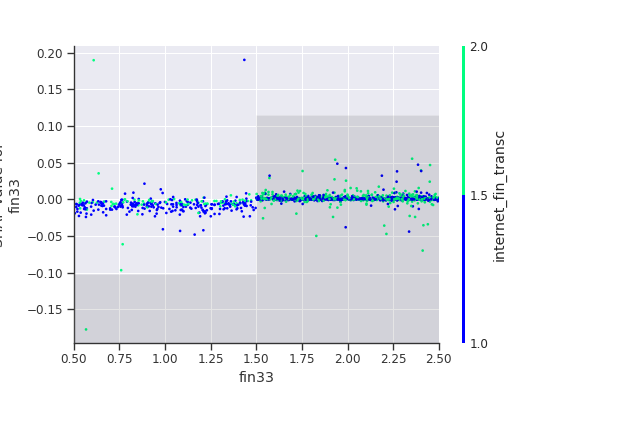

<IPython.core.display.Javascript object>


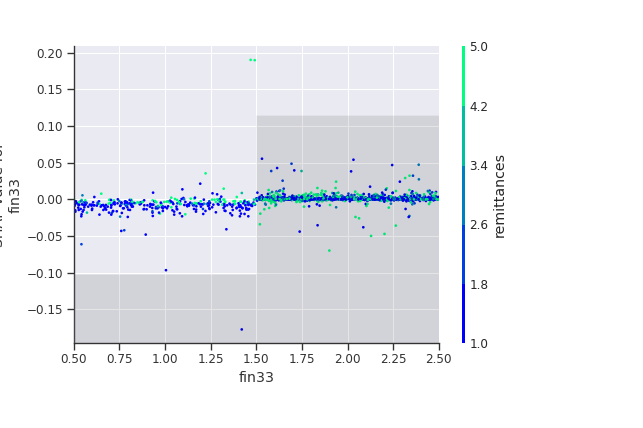

<IPython.core.display.Javascript object>


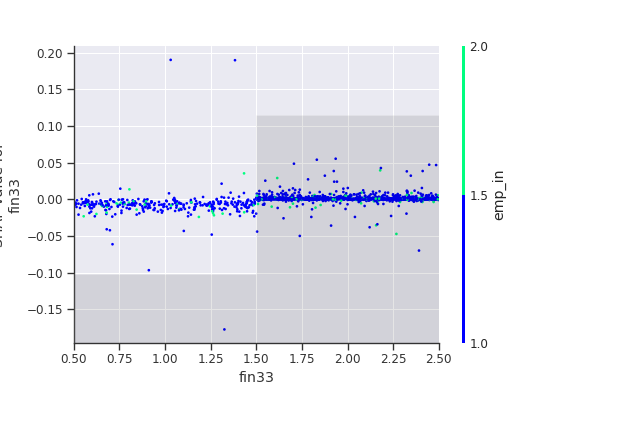

<IPython.core.display.Javascript object>


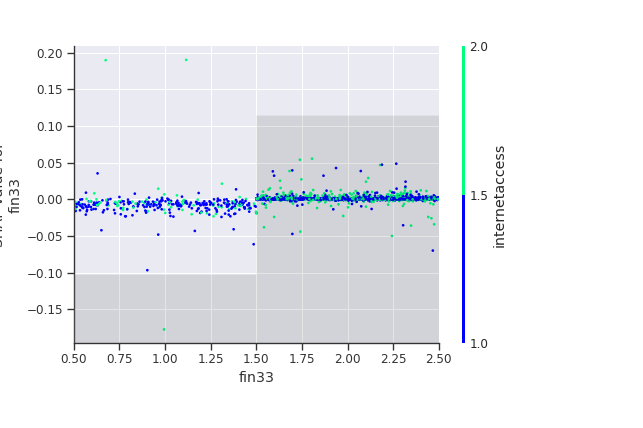

<IPython.core.display.Javascript object>


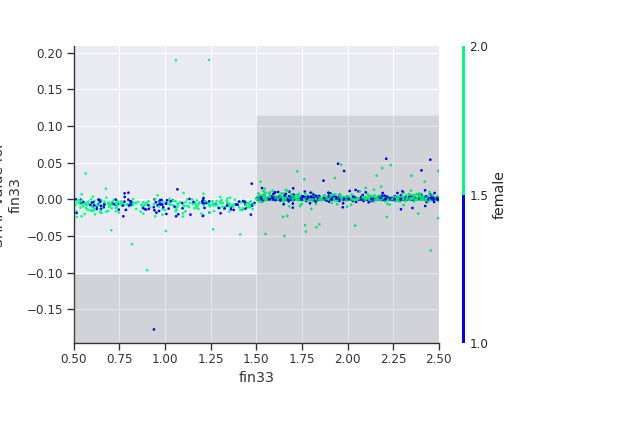

<IPython.core.display.Javascript object>


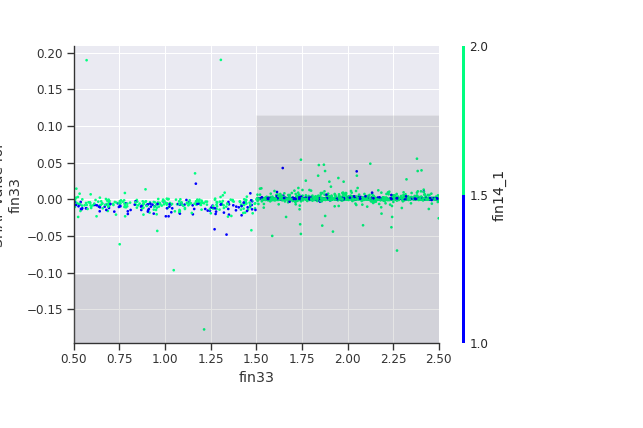

<IPython.core.display.Javascript object>


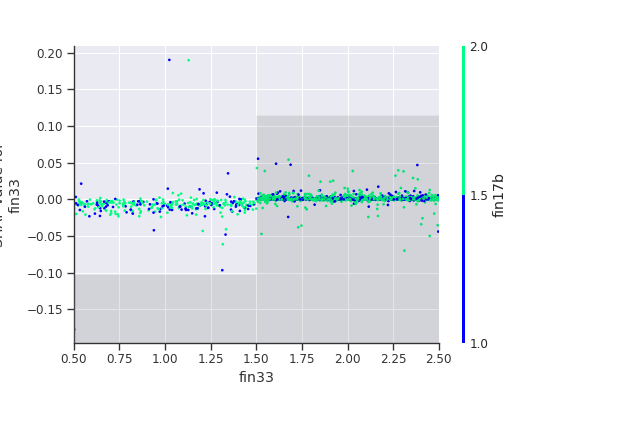

<IPython.core.display.Javascript object>


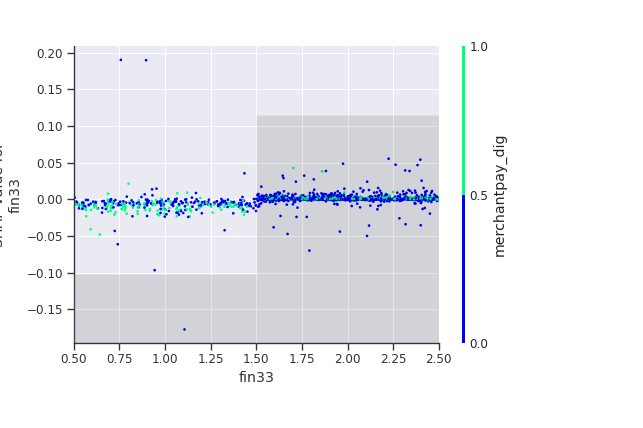

<IPython.core.display.Javascript object>


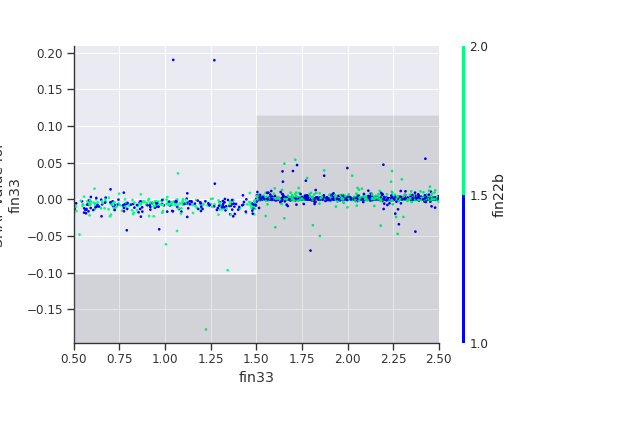

<IPython.core.display.Javascript object>


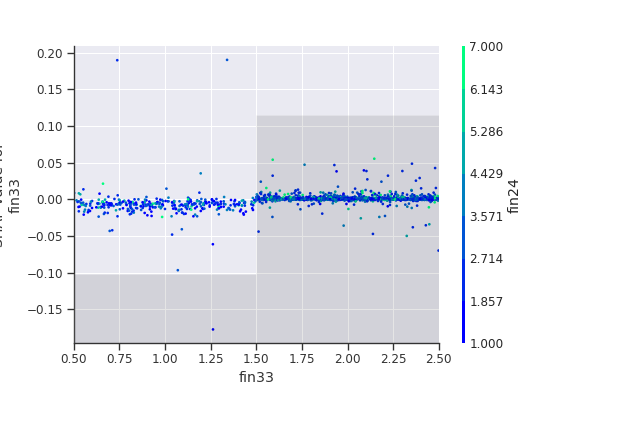

<IPython.core.display.Javascript object>


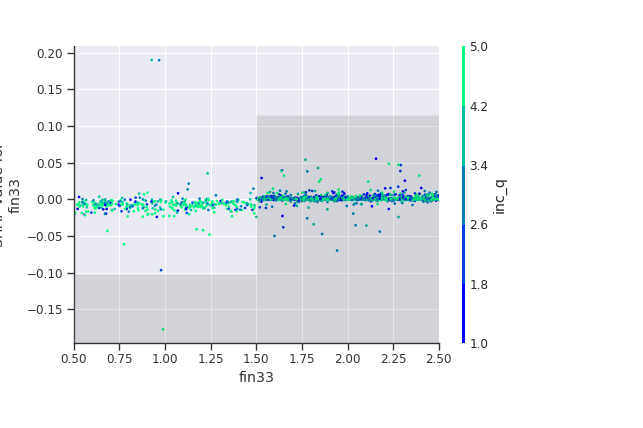

<IPython.core.display.Javascript object>


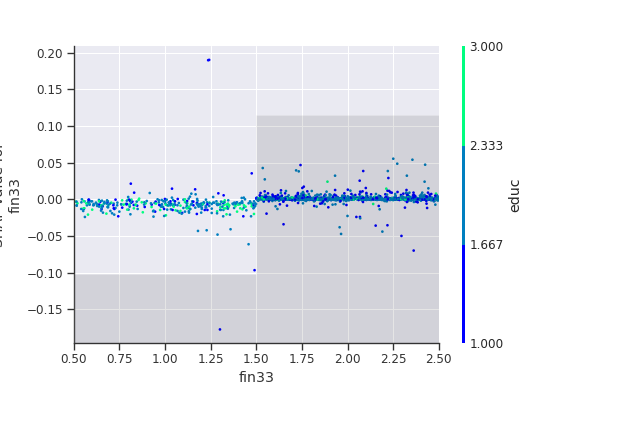

<IPython.core.display.Javascript object>


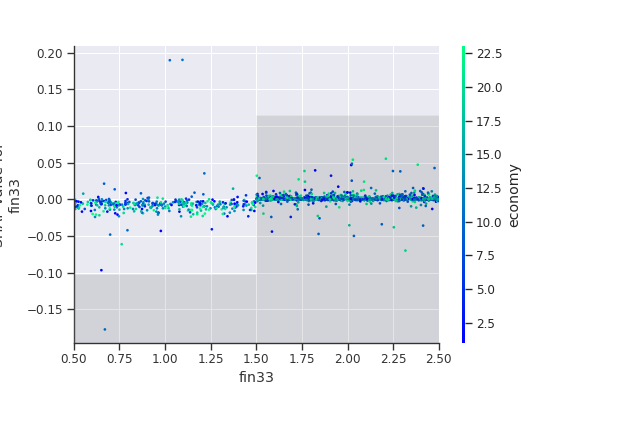

<IPython.core.display.Javascript object>


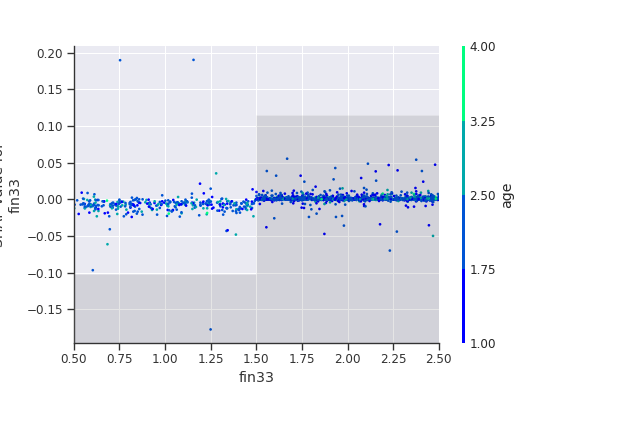

<IPython.core.display.Javascript object>


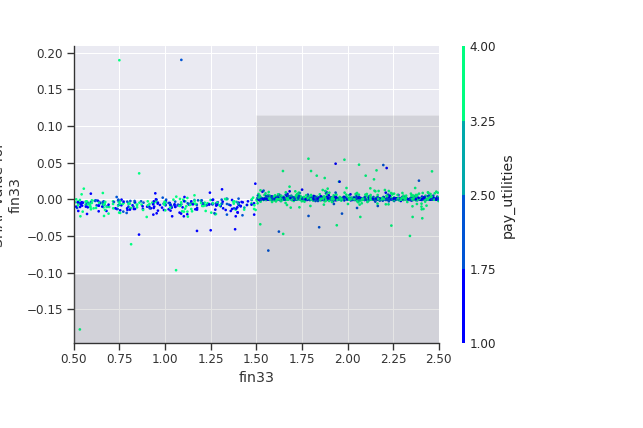

<IPython.core.display.Javascript object>


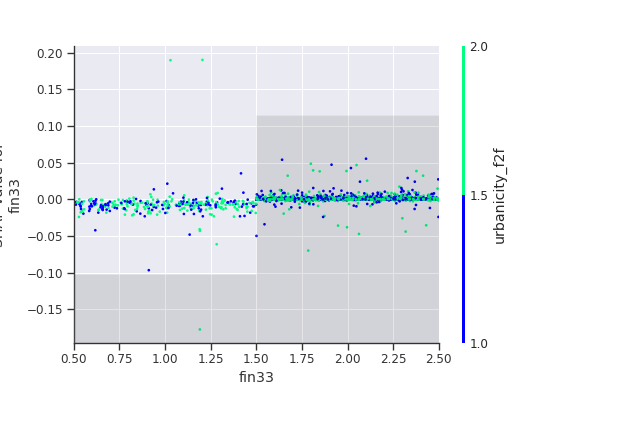

<IPython.core.display.Javascript object>


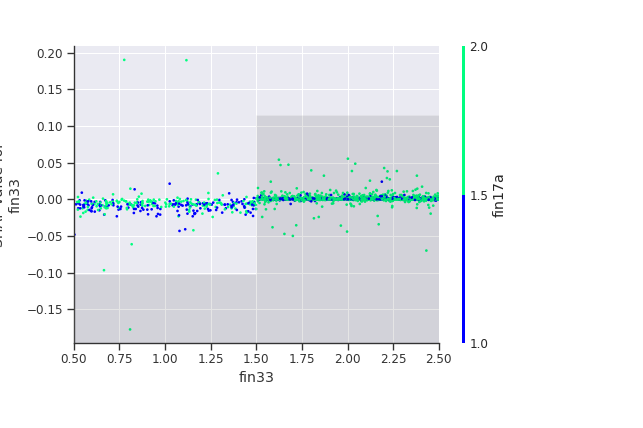

<IPython.core.display.Javascript object>


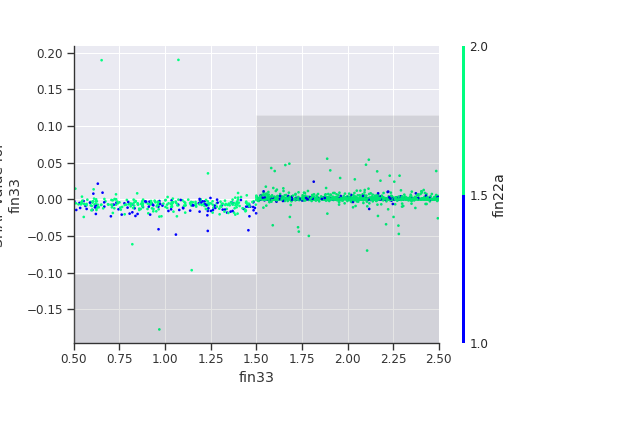

<IPython.core.display.Javascript object>


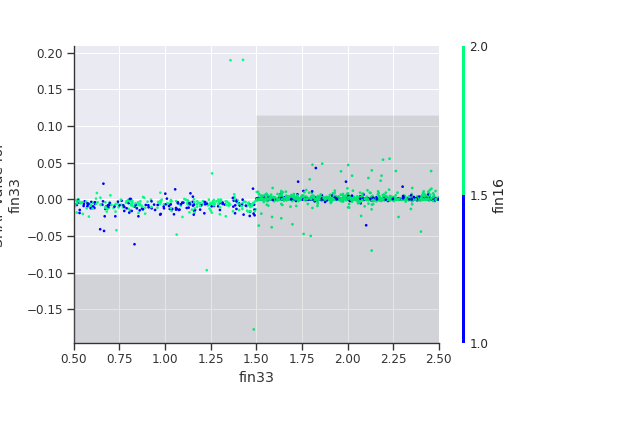

<IPython.core.display.Javascript object>


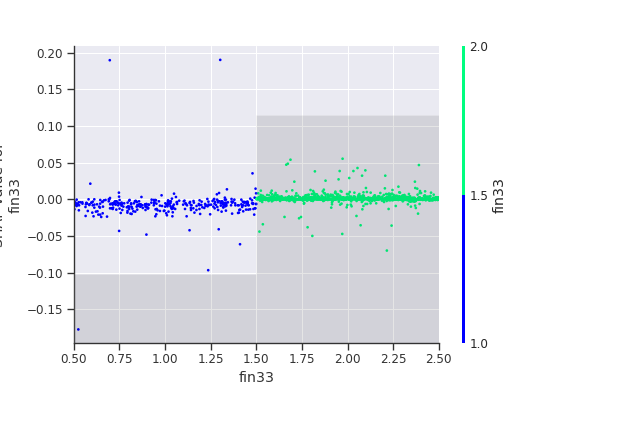

In [450]:
inds = shap.utils.potential_interactions(shap_values[:, "fin33"], shap_values)

# make plots colored by each of the top three possible interacting features
for i in range(22):
    shap.plots.scatter(shap_values[:,"fin33"], color=shap_values[:,inds[i]], cmap = viridis_cmap, dot_size=6, x_jitter=1, show = False)
plt.savefig('img/accountinteraction.png')

<IPython.core.display.Javascript object>


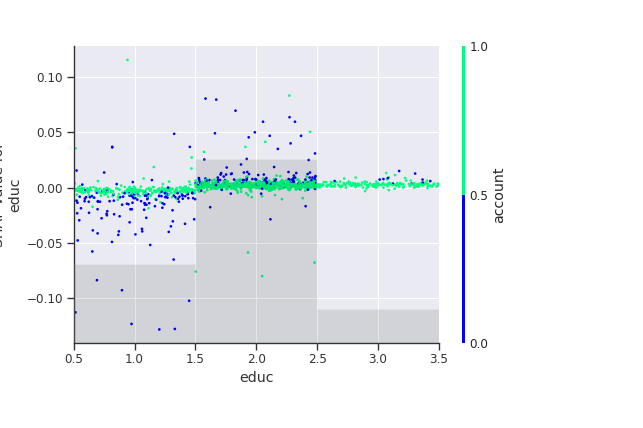

<IPython.core.display.Javascript object>


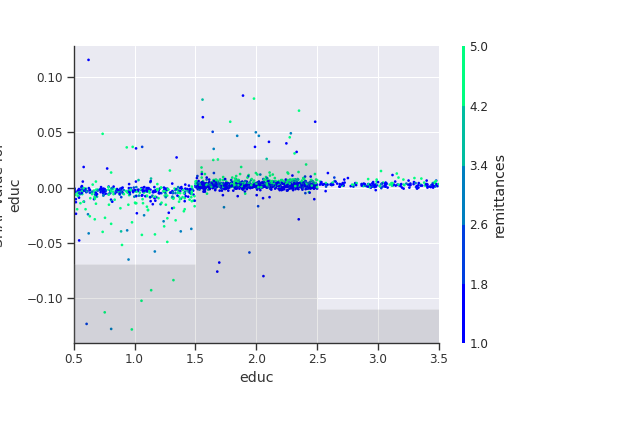

<IPython.core.display.Javascript object>


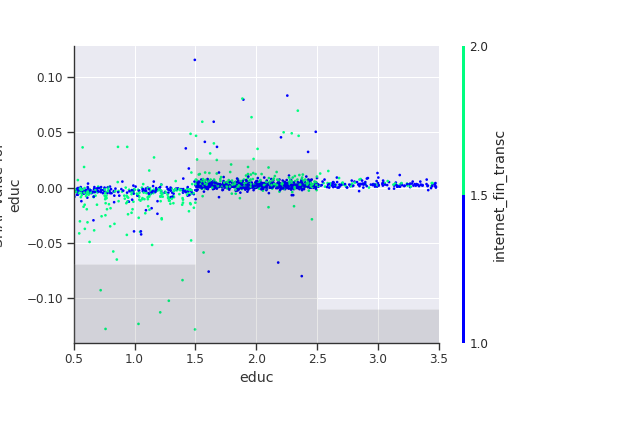

<IPython.core.display.Javascript object>


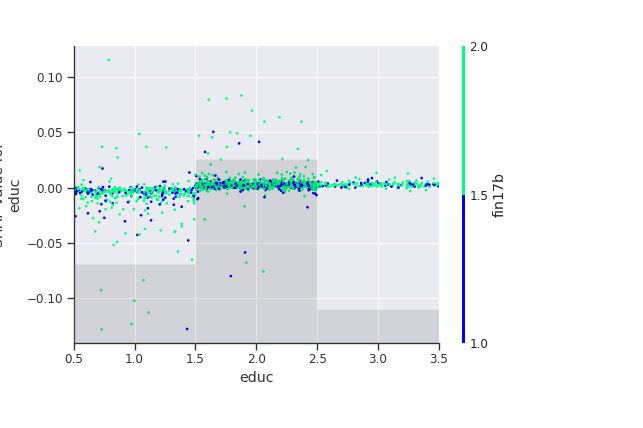

<IPython.core.display.Javascript object>


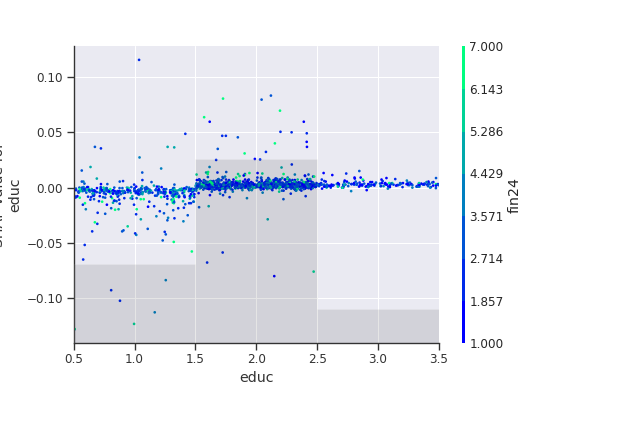

<IPython.core.display.Javascript object>


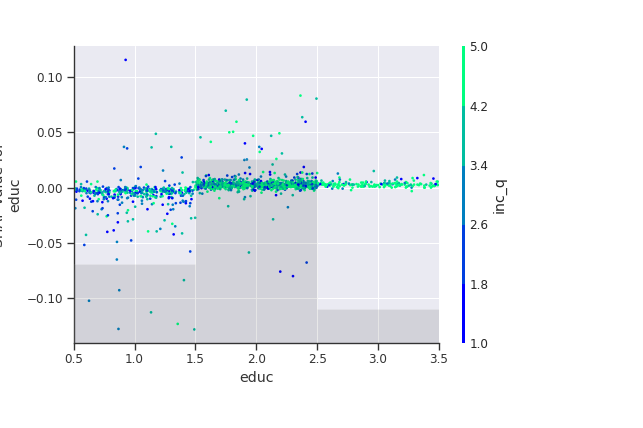

<IPython.core.display.Javascript object>


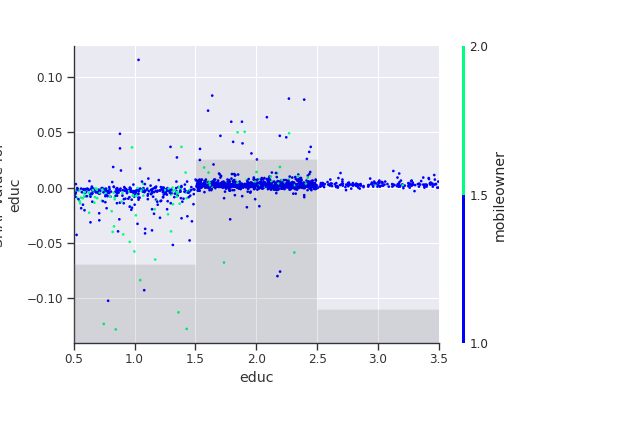

<IPython.core.display.Javascript object>


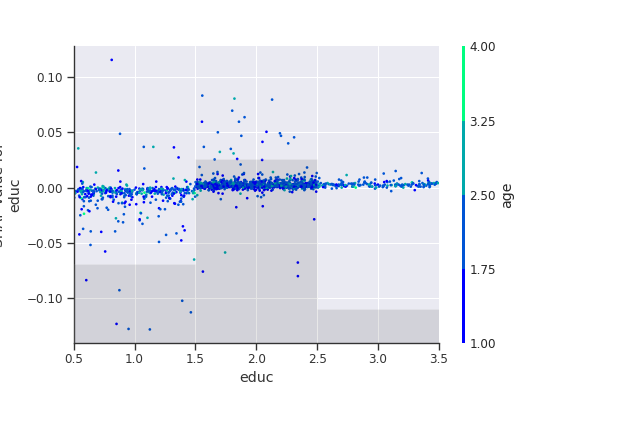

<IPython.core.display.Javascript object>


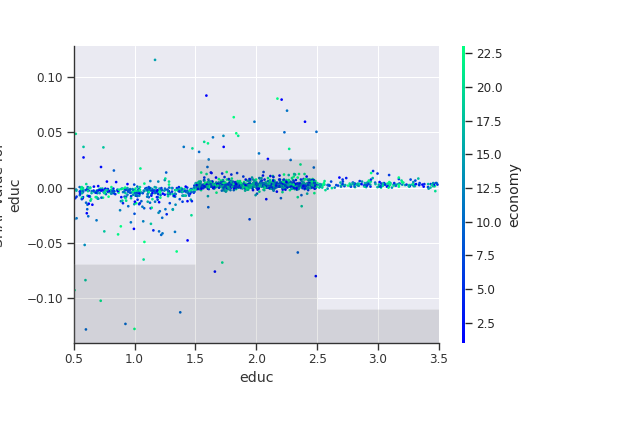

<IPython.core.display.Javascript object>


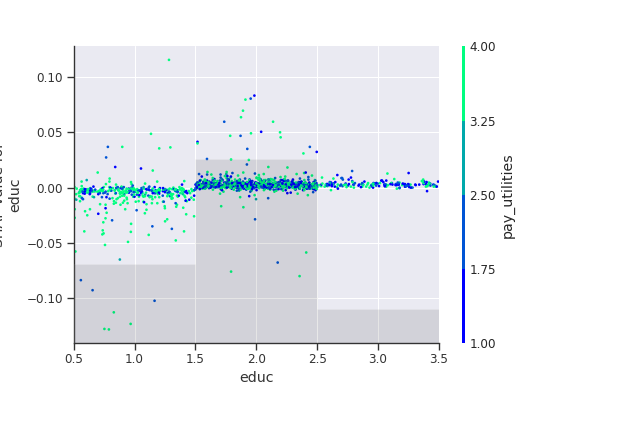

<IPython.core.display.Javascript object>


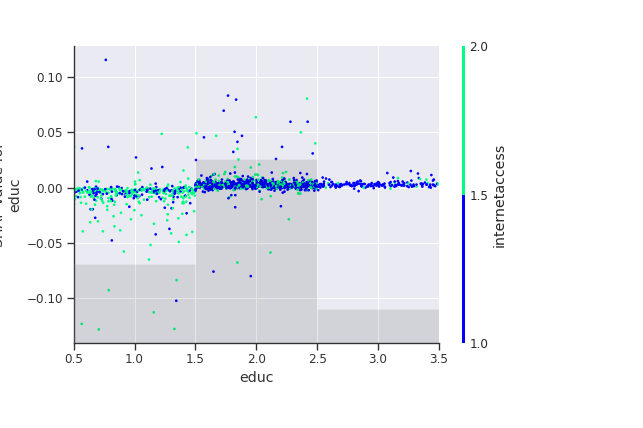

<IPython.core.display.Javascript object>


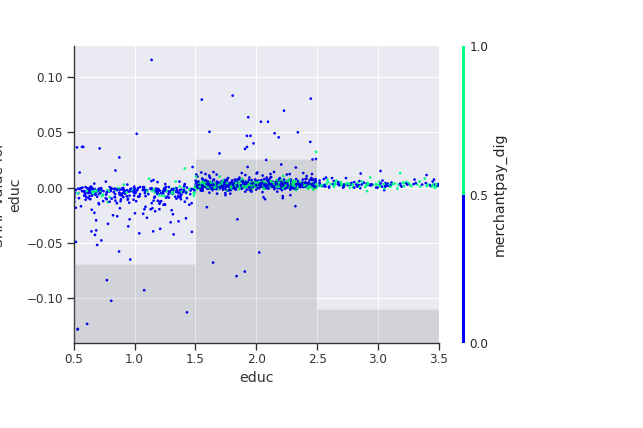

<IPython.core.display.Javascript object>


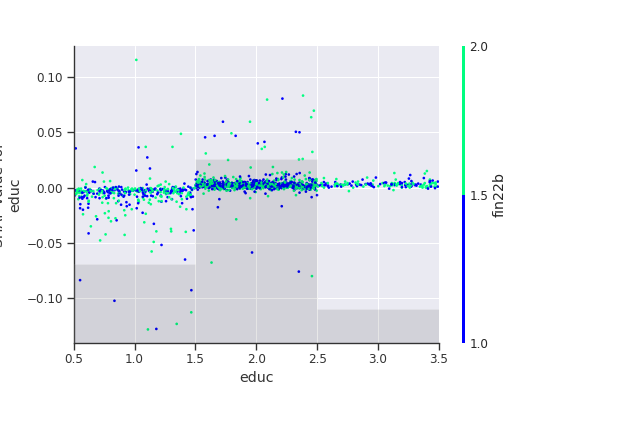

<IPython.core.display.Javascript object>


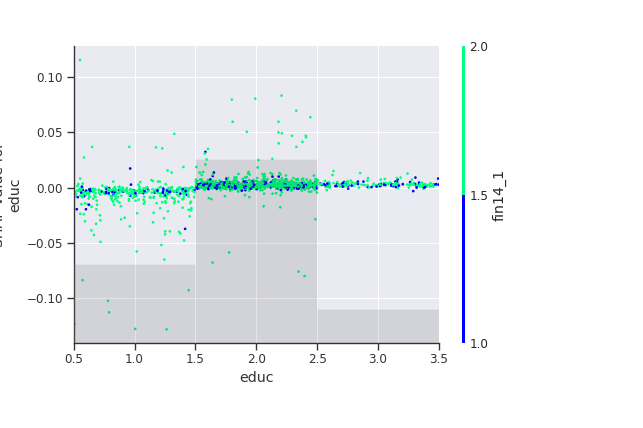

<IPython.core.display.Javascript object>


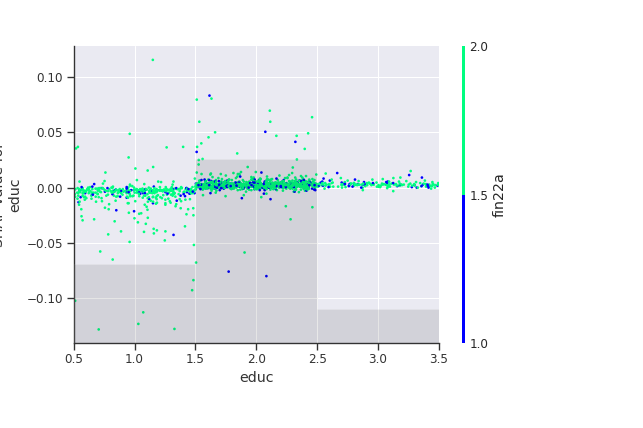

<IPython.core.display.Javascript object>


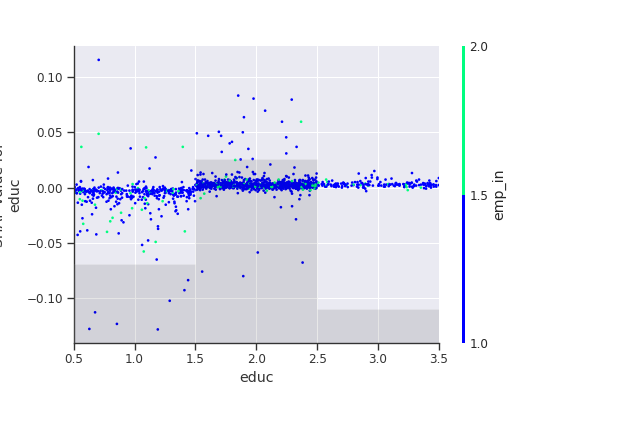

<IPython.core.display.Javascript object>


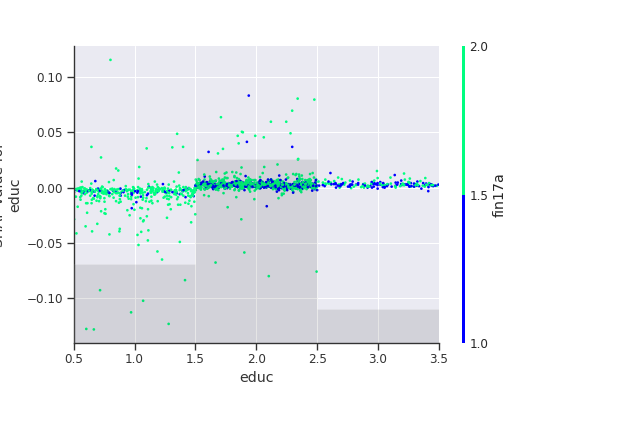

<IPython.core.display.Javascript object>


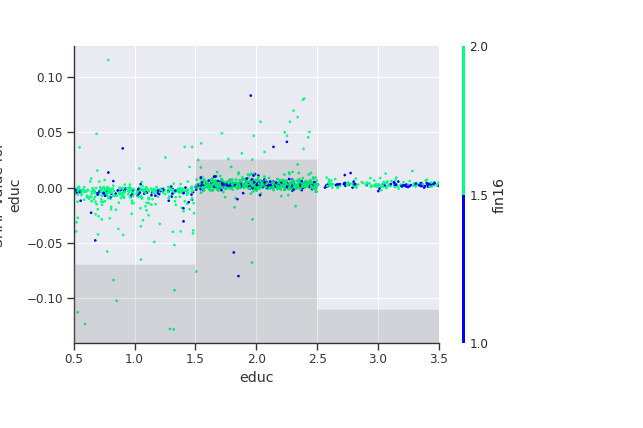

<IPython.core.display.Javascript object>


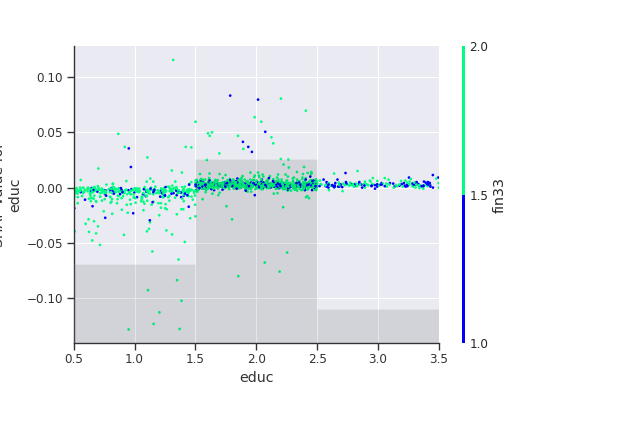

<IPython.core.display.Javascript object>


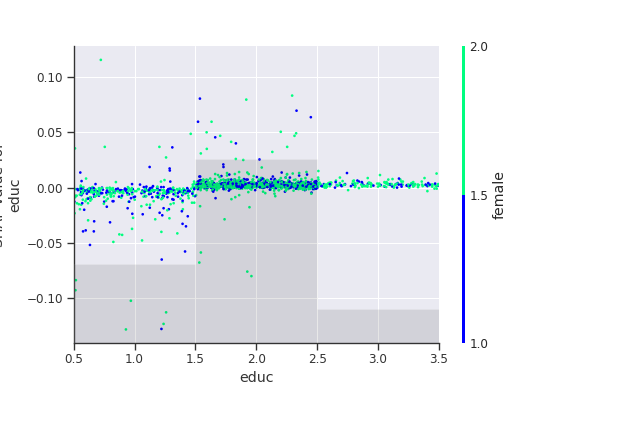

<IPython.core.display.Javascript object>


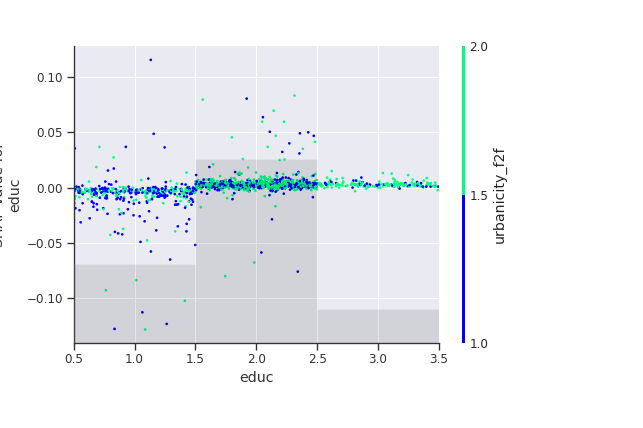

<IPython.core.display.Javascript object>


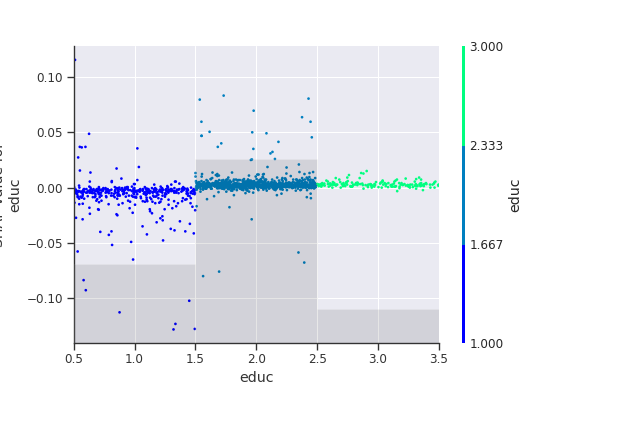

In [442]:
inds = shap.utils.potential_interactions(shap_values[:, "educ"], shap_values)

# make plots colored by each of the top three possible interacting features
for i in range(22):
    shap.plots.scatter(shap_values[:,"educ"], color=shap_values[:,inds[i]], cmap = viridis_cmap, dot_size=6, x_jitter=1, show = False)
plt.savefig('img/educinteraction.png')

In [ ]:
# import dice_ml

# X_train_xgb['receive_digital_wages']= y_train_xgb
# # continous_col=["age","fare"]
# dice_data = dice_ml.Data(dataframe=X_train_xgb,continuous_features=[],outcome_name='receive_digital_wages')
# dice_model= dice_ml.Model(model=model, backend="sklearn")
# explainer = dice_ml.Dice(dice_data,dice_model, method="random")

# e1 = explainer.generate_counterfactuals(X_test_xgb[1:2], total_CFs=2, desired_class="opposite")
# e1.visualize_as_dataframe(show_only_changes=True)

In [282]:
categorical_features = X_train_xgb.columns

Computing partial dependence plots...


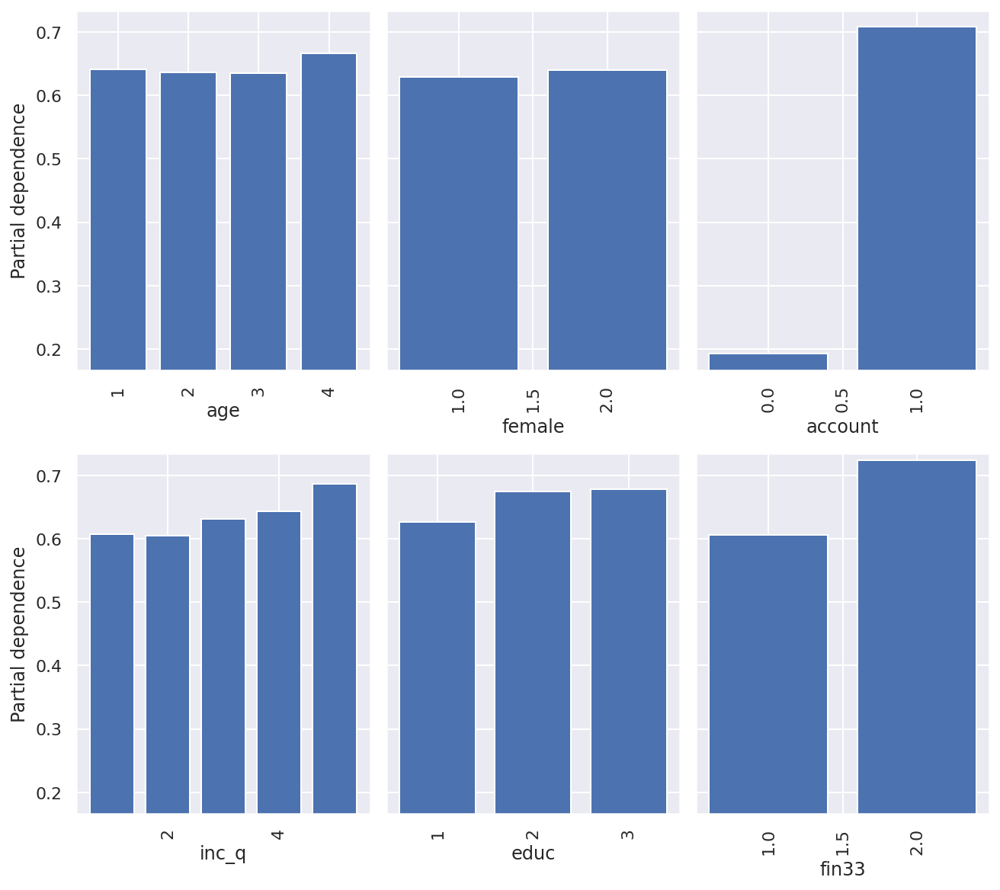

In [343]:
from sklearn.inspection import PartialDependenceDisplay

common_params = {
    "subsample": 50,
    "n_jobs": 2,
    "grid_resolution": 20,
    "random_state": 0,
}

print("Computing partial dependence plots...")
features_info = {
    # features of interest
    "features": ["age", "female", "account", "inc_q", "educ", "fin33"],
    # type of partial dependence plot
    "kind": "average",
    # information regarding categorical features
    "categorical_features": categorical_features,
}

_, ax = plt.subplots(ncols=3, nrows=2, figsize=(9, 8), constrained_layout=True)
display = PartialDependenceDisplay.from_estimator(
    model,
    X_train_xgb,
    **features_info,
    ax=ax,
    **common_params,
)

Computing partial dependence plots and individual conditional expectation...


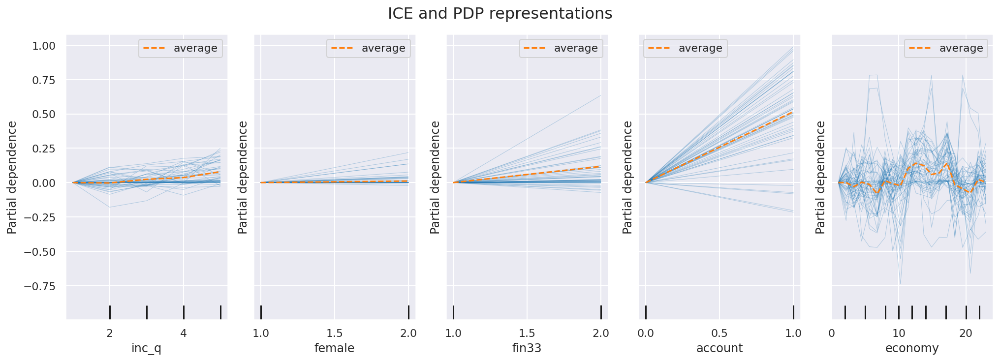

In [349]:
print("Computing partial dependence plots and individual conditional expectation...")
_, ax = plt.subplots(ncols=5, figsize=(14, 5), sharey=True, constrained_layout=True)

features_info = {
    "features": ["inc_q", "female", "fin33", "account", "economy"],
    "kind": "both",
    "centered": True,
}

display = PartialDependenceDisplay.from_estimator(
    model,
    X_train_xgb,
    **features_info,
    ax=ax,
    **common_params,
)
_ = display.figure_.suptitle("ICE and PDP representations", fontsize=16)

Computing partial dependence plots...


<IPython.core.display.Javascript object>


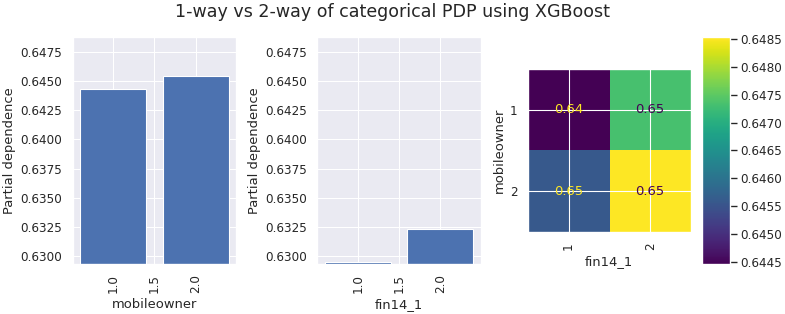

done in 3.380s


In [456]:
print("Computing partial dependence plots...")
features_info = {
    "features": ["mobileowner", "fin14_1", ("mobileowner", "fin14_1")],
    "kind": "average",
    "categorical_features": categorical_features
}
_, ax = plt.subplots(ncols=3, figsize=(10, 4), constrained_layout=True)
tic = time()
display = PartialDependenceDisplay.from_estimator(
    model,
    X_train_xgb,
    **features_info,
    ax=ax,
    **common_params,
)
print(f"done in {time() - tic:.3f}s")
_ = display.figure_.suptitle(
    "1-way vs 2-way of categorical PDP using XGBoost", fontsize=16
)

<IPython.core.display.Javascript object>


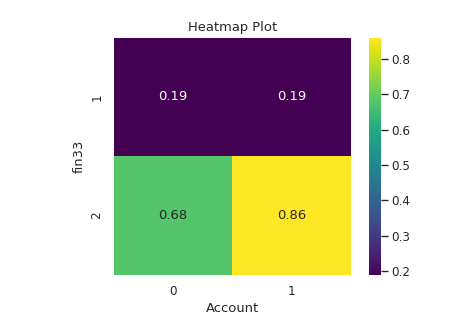

In [451]:
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np

# Define the data
data = np.array([[0.19, 0.19], [0.68, 0.86]])

# Define the x-axis and y-axis labels
x_labels = ['0', '1']
y_labels = ['1', '2']

# Create the heatmap plot
fig, ax = plt.subplots(figsize=(6, 4))
sns.heatmap(data, cmap='viridis', annot=True, fmt=".2f", cbar=True, square=True,
            xticklabels=x_labels, yticklabels=y_labels, ax=ax)

# Set the axis labels and title
ax.set_xlabel('Account')
ax.set_ylabel('fin33')
ax.set_title('Heatmap Plot')

# Show the plot
plt.show()

<IPython.core.display.Javascript object>


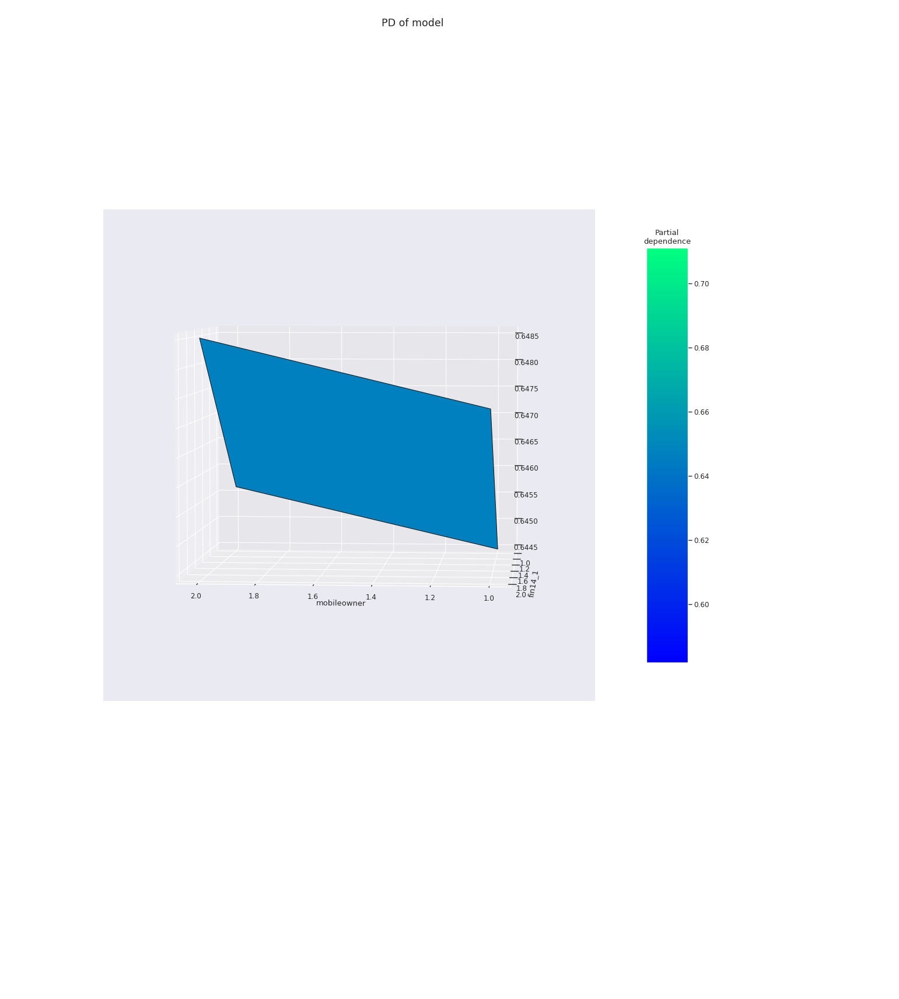

In [455]:
# %matplotlib notebook
import numpy as np

# unused but required import for doing 3d projections with matplotlib < 3.2
import mpl_toolkits.mplot3d  # noqa: F401

from sklearn.inspection import partial_dependence

fig = plt.figure(figsize=(18, 20))

features = ("mobileowner", "fin14_1")
pdp = partial_dependence(
    model, X_train_xgb, features=features, kind="average", grid_resolution=10
)
XX, YY = np.meshgrid(pdp["values"][0], pdp["values"][1])
Z = pdp.average[0].T
ax = fig.add_subplot(projection="3d")
fig.add_axes(ax)

surf = ax.plot_surface(XX, YY, Z, rstride=1, cstride=1, cmap="winter", edgecolor="k")
ax.set_xlabel(features[0])
ax.set_ylabel(features[1])
fig.suptitle(
    "PD of model",
    fontsize=16,
)
# pretty init view
ax.view_init(elev=22, azim=122)
clb = plt.colorbar(surf, pad=0.08, shrink=0.6, aspect=10)
clb.ax.set_title("Partial\ndependence")
plt.show()

In [362]:
pip install association-metrics

Defaulting to user installation because normal site-packages is not writeable
  Preparing metadata (setup.py) ... done
  Created wheel for association-metrics: filename=association_metrics-0.0.1-py3-none-any.whl size=3953 sha256=6d5b34890a0858d24b767c31f45d3663c3f9a0c42951aee34e9edd0e36a80c28
  Stored in directory: /home/socrates/.cache/pip/wheels/49/ef/10/d93c981055c4fc0401028bc9dfda085ddd5ca204bcda0f2110
Successfully built association-metrics
Note: you may need to restart the kernel to use updated packages.


In [364]:
import association_metrics as am
df = X_train_xgb.apply(lambda x:x.astype("category") if x.dtype == '0' else x)
cramersv = am.CramersV(df)
g=cramersv.fit()

<AxesSubplot:>

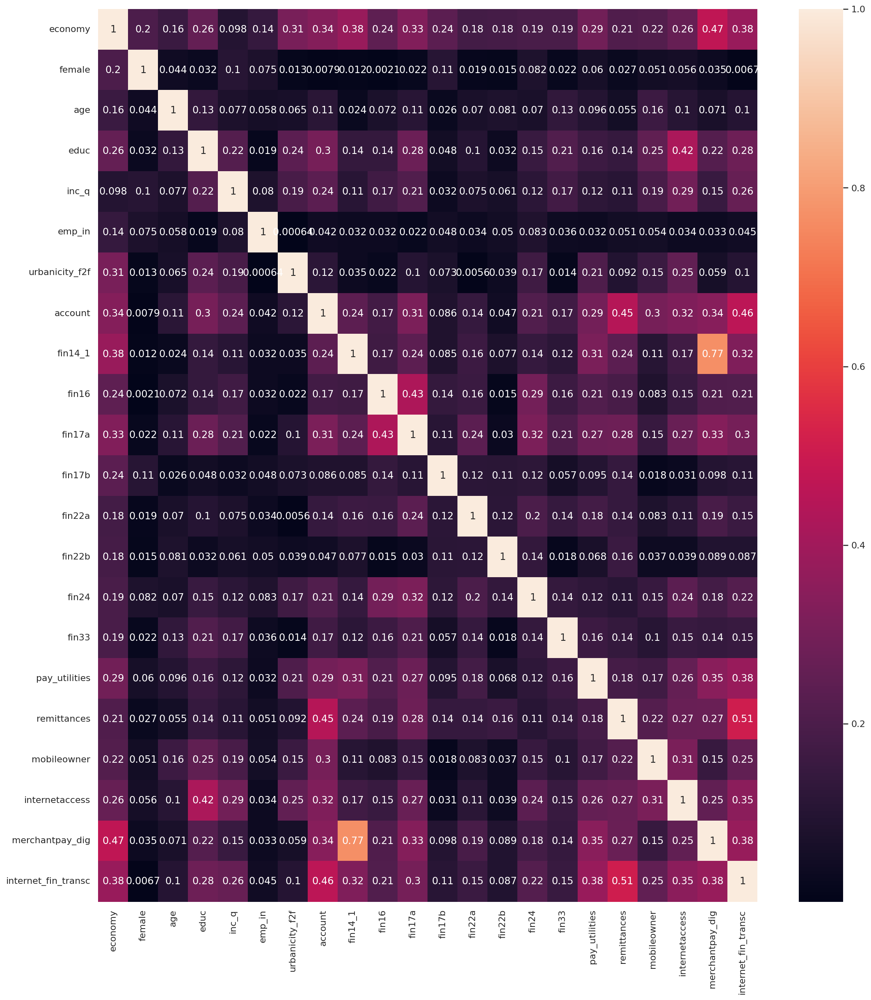

In [369]:
plt.figure(figsize=(18, 20))
sns.heatmap(g, annot=True)

In [370]:
from scipy.stats import chisquare

df=X_train_xgb.apply(lambda x : pd.factorize(x)[0])+1

pd.DataFrame([chisquare(df[x].values,f_exp=df.values.T,axis=1)[0] for x in df])

,0,1,2,3,4,5,6,7,8,9,...,12,13,14,15,16,17,18,19,20,21
0,0.000000,492512.5,inf,555718.833333,426313.116667,722752.0,570200.0,670330.5,688605.0,670004.5,...,397706.5,537141.5,350775.514286,445433.0,533762.916667,278347.966667,709434.5,513350.5,444357.0,589515.0
1,40595.892874,0.0,inf,2238.166667,4304.633333,2618.0,1885.5,2359.0,2317.5,2246.5,...,1093.5,1789.0,5214.747619,1288.0,2487.000000,2948.700000,2565.5,1484.0,1368.0,1985.0
2,37821.063341,3462.5,NaN,5162.333333,4652.783333,6724.0,4488.5,5901.0,6003.5,5997.0,...,1888.0,4264.5,5125.638095,2163.0,5112.833333,2407.166667,6426.0,3590.0,2867.5,4787.5
3,41458.958817,2169.5,inf,0.000000,5203.400000,3075.5,2471.0,2839.0,2784.0,2594.0,...,1930.5,2279.5,5897.888095,2201.0,2910.083333,3736.700000,2974.5,2168.5,2162.5,2573.0
4,37510.167195,11034.5,inf,12994.333333,0.000000,17515.0,11577.5,14976.0,16450.0,16412.0,...,7022.5,12403.5,8376.638095,7291.5,13476.833333,5430.766667,16582.0,12494.0,8612.0,11824.5
5,43945.535562,1463.5,inf,1441.666667,4600.383333,0.0,1090.0,704.0,800.5,843.5,...,1694.5,1152.5,6275.333333,1575.5,2208.000000,4712.000000,571.5,1389.0,1447.0,991.5
6,41841.951512,1455.0,inf,1743.166667,3921.983333,1814.0,0.0,1598.5,1779.0,1745.5,...,1347.0,1618.0,5464.211905,1406.5,2734.500000,3601.000000,1643.0,1889.0,1351.5,1463.0
7,43270.087494,1428.5,inf,1387.166667,4162.033333,928.0,1098.5,0.0,1334.0,1291.5,...,1463.0,1249.5,6107.633333,1348.5,2633.750000,4454.850000,721.0,1810.0,1049.0,626.5
8,43382.115660,1440.0,inf,1667.166667,4683.633333,1077.5,1332.0,1387.0,0.0,962.5,...,1731.0,1441.0,5996.526190,1655.5,1916.250000,4203.500000,1155.5,1178.0,2436.0,1692.5
9,43027.152324,1428.5,inf,1612.666667,4784.033333,1180.0,1358.0,1404.0,1022.0,0.0,...,1704.5,1344.0,5950.690476,1695.0,1954.750000,4125.250000,1237.0,1208.5,1739.0,1603.0


In [373]:
from scipy.stats import chi2_contingency
df = X_train_xgb
factors_paired = [(i,j) for i in df.columns.values for j in df.columns.values] 

chi2, p_values =[], []

for f in factors_paired:
    if f[0] != f[1]:
        chitest = chi2_contingency(pd.crosstab(df[f[0]], df[f[1]]))   
        chi2.append(chitest[0])
        p_values.append(chitest[1])
    else:      # for same factor pair
        chi2.append(0)
        p_values.append(0)

chi2 = np.array(chi2).reshape((22,22)) # shape it as a matrix
chi2 = pd.DataFrame(chi2, index=df.columns.values, columns=df.columns.values) # then a df for convenience


<AxesSubplot:>

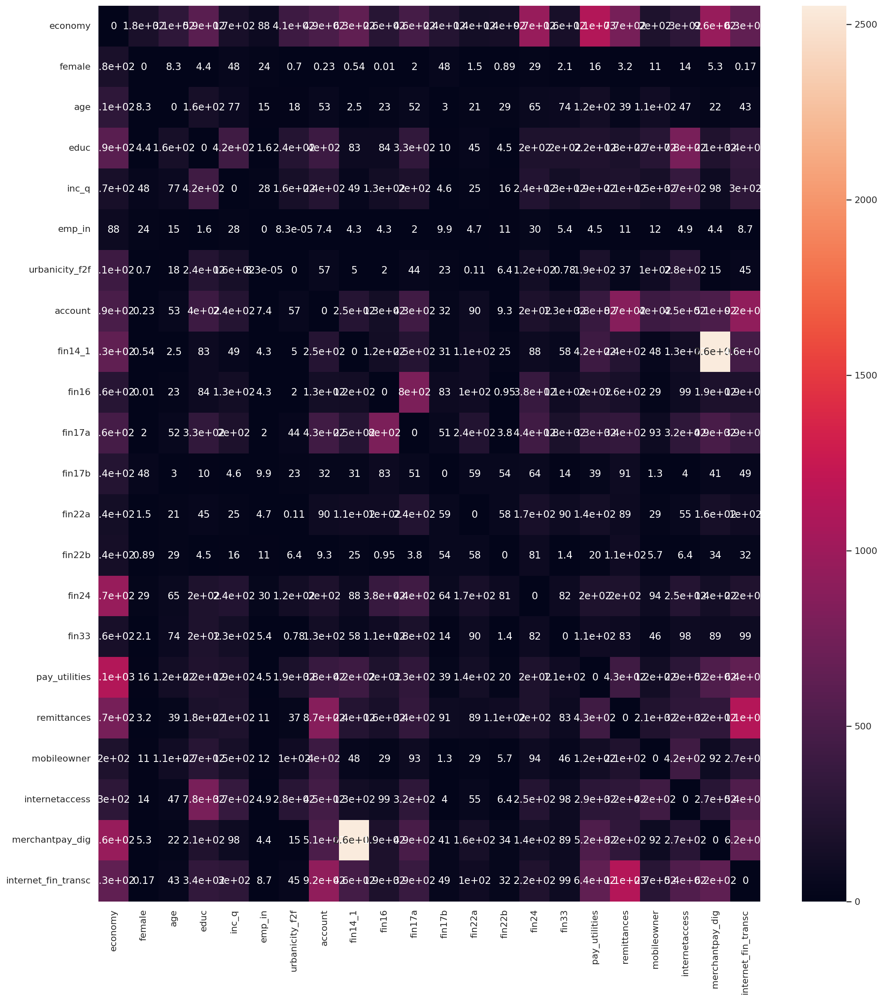

In [376]:
plt.figure(figsize=(18, 20))
sns.heatmap(chi2, annot=True)